In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/titanic/train.csv
/kaggle/input/titanic/test.csv
/kaggle/input/titanic/gender_submission.csv
/kaggle/input/input3/input.jpg
/kaggle/input/lr-dataset/lr_dataset.csv
/kaggle/input/linear-and-spiral/spiral.csv
/kaggle/input/linear-and-spiral/linear.csv
/kaggle/input/digit-recognizer/sample_submission.csv
/kaggle/input/digit-recognizer/train.csv
/kaggle/input/digit-recognizer/test.csv
/kaggle/input/xor-data/xor_dataset.csv
/kaggle/input/househouse/USA_Housing.csv
/kaggle/input/stylejpg/style.jpg
/kaggle/input/stylejpg/04.jpg
/kaggle/input/zhuchengfen/PCA_dataset.csv
/kaggle/input/jpg-noisyimg-and-origimg/origimg.jpg
/kaggle/input/jpg-noisyimg-and-origimg/noisyimg.jpg
/kaggle/input/style-1/style (1).jpg
/kaggle/input/k-nearest-neighbors-1/gauss (1).csv
/kaggle/input/k-nearest-neighbors-1/mnist_x.txt
/kaggle/input/k-nearest-neighbors-1/mnist_y.txt
/kaggle/input/kmeans-data1/kmeans_data.csv
/kaggle/input/sindata-10000/sindata_1000.csv
/kaggle/input/shuangxianxing1/fm_dataset.csv

# 3 k近邻算法

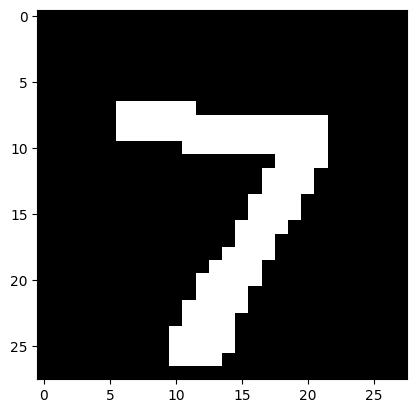

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os

# 读入mnist数据集
m_x = np.loadtxt('/kaggle/input/k-nearest-neighbors-1/mnist_x.txt', delimiter=' ')
m_y = np.loadtxt('/kaggle/input/k-nearest-neighbors-1/mnist_y.txt')

# 数据集可视化
data = np.reshape(np.array(m_x[0], dtype=int), [28, 28])
plt.figure()
plt.imshow(data, cmap='gray')

# 将数据集分为训练集和测试集
ratio = 0.8
split = int(len(m_x) * ratio)
# 打乱数据
np.random.seed(0)
idx = np.random.permutation(np.arange(len(m_x)))
m_x = m_x[idx]
m_y = m_y[idx]
x_train, x_test = m_x[:split], m_x[split:]
y_train, y_test = m_y[:split], m_y[split:]

In [3]:
def distance(a, b):
    return np.sqrt(np.sum(np.square(a - b)))

In [4]:
class KNN:
    def __init__(self, k, label_num):
        self.k = k
        self.label_num = label_num # 类别的数量

    def fit(self, x_train, y_train):
        # 在类中保存训练数据
        self.x_train = x_train
        self.y_train = y_train

    def get_knn_indices(self, x):
        # 获取距离目标样本点最近的K个样本点的标签
        # 计算已知样本的距离
        dis = list(map(lambda a: distance(a, x), self.x_train)) 
        # 按距离从小到大排序，并得到对应的下标
        knn_indices = np.argsort(dis) 
        # 取最近的K个
        knn_indices = knn_indices[:self.k] 
        return knn_indices

    def get_label(self, x):
        # 对KNN方法的具体实现，观察K个近邻并使用np.argmax获取其中数量最多的类别
        knn_indices = self.get_knn_indices(x)
        # 类别计数
        label_statistic = np.zeros(shape=[self.label_num]) 
        for index in knn_indices:
            label = int(self.y_train[index])
            label_statistic[label] += 1
        # 返回数量最多的类别
        return np.argmax(label_statistic) 

    def predict(self, x_test): 
        # 预测样本 test_x 的类别
        predicted_test_labels = np.zeros(shape=[len(x_test)], dtype=int)
        for i, x in enumerate(x_test):
            predicted_test_labels[i] = self.get_label(x)
        return predicted_test_labels

In [5]:
for k in range(1, 10):
    knn = KNN(k, label_num=10)
    knn.fit(x_train, y_train)
    predicted_labels = knn.predict(x_test)

    accuracy = np.mean(predicted_labels == y_test)
    print(f'K的取值为 {k}, 预测准确率为 {accuracy * 100:.1f}%')

K的取值为 1, 预测准确率为 88.5%
K的取值为 2, 预测准确率为 88.5%
K的取值为 3, 预测准确率为 87.5%
K的取值为 4, 预测准确率为 86.5%
K的取值为 5, 预测准确率为 89.0%
K的取值为 6, 预测准确率为 87.5%
K的取值为 7, 预测准确率为 88.0%
K的取值为 8, 预测准确率为 87.5%
K的取值为 9, 预测准确率为 87.0%


数据集大小： 200


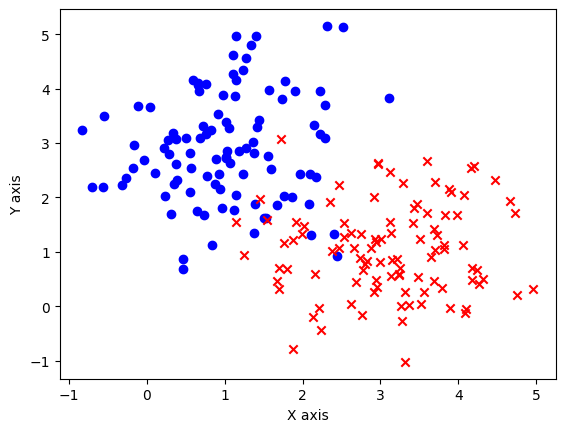

In [6]:
from sklearn.neighbors import KNeighborsClassifier # sklearn中的KNN分类器
from matplotlib.colors import ListedColormap

# 读入高斯数据集
data = np.loadtxt('/kaggle/input/k-nearest-neighbors-1/gauss (1).csv', delimiter=',')
x_train = data[:, :2]
y_train = data[:, 2]
print('数据集大小：', len(x_train))

# 可视化
plt.figure()
plt.scatter(x_train[y_train == 0, 0], x_train[y_train == 0, 1], c='blue', marker='o')
plt.scatter(x_train[y_train == 1, 0], x_train[y_train == 1, 1], c='red', marker='x')
plt.xlabel('X axis')
plt.ylabel('Y axis')
plt.show()

In [7]:
# 设置步长
step = 0.02 
# 设置网格边界
x_min, x_max = np.min(x_train[:, 0]) - 1, np.max(x_train[:, 0]) + 1 
y_min, y_max = np.min(x_train[:, 1]) - 1, np.max(x_train[:, 1]) + 1
# 构造网格
xx, yy = np.meshgrid(np.arange(x_min, x_max, step), np.arange(y_min, y_max, step))
grid_data = np.concatenate([xx.reshape(-1, 1), yy.reshape(-1, 1)], axis=1)

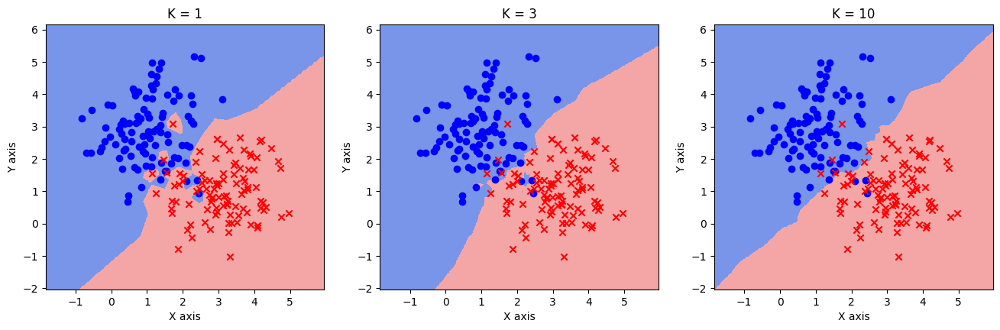

In [8]:
fig = plt.figure(figsize=(16,4.5))
# K值，读者可以自行调整，观察分类结果的变化
ks = [1, 3, 10] 
cmap_light = ListedColormap(['royalblue', 'lightcoral'])

for i, k in enumerate(ks):
    # 定义KNN分类器
    knn = KNeighborsClassifier(n_neighbors=k) 
    knn.fit(x_train, y_train)
    z = knn.predict(grid_data)

    # 画出分类结果
    ax = fig.add_subplot(1, 3, i + 1)
    ax.pcolormesh(xx, yy, z.reshape(xx.shape), cmap=cmap_light, alpha=0.7)
    ax.scatter(x_train[y_train == 0, 0], x_train[y_train == 0, 1], c='blue', marker='o')
    ax.scatter(x_train[y_train == 1, 0], x_train[y_train == 1, 1], c='red', marker='x')

    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_title(f'K = {k}')
plt.show()

In [9]:
!pip install scikit-image
from skimage import io # 图像输入输出
from skimage.color import rgb2lab, lab2rgb # 图像通道转换
from sklearn.neighbors import KNeighborsRegressor # KNN 回归器
import os

path = 'style_transfer'

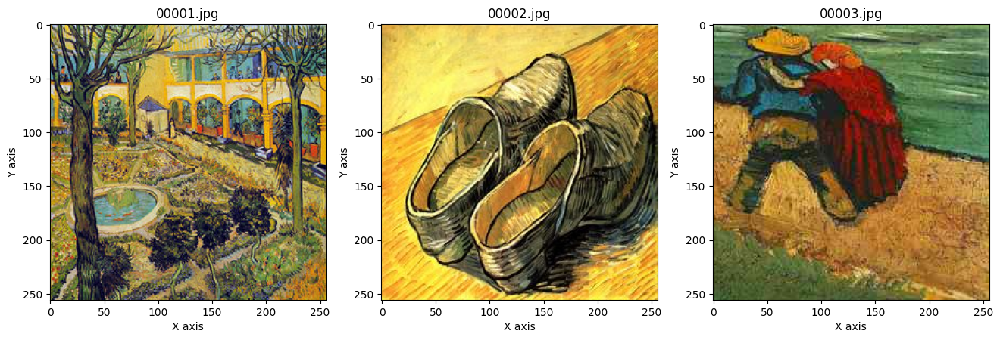

In [10]:
data_dir = os.path.join(path, '/kaggle/input/vangogh')
fig = plt.figure(figsize=(16, 5))
for i, file in enumerate(np.sort(os.listdir(data_dir))[:3]):
    img = io.imread(os.path.join(data_dir, file))
    ax = fig.add_subplot(1, 3, i + 1)
    ax.imshow(img)
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_title(file)
plt.show()


In [11]:
# block_size表示向外扩展的层数，扩展1层即3*3
block_size = 1 

def read_style_image(file_name, size=block_size):
    # 读入风格图像, 得到映射 X->Y
    # 其中X储存3*3像素格的灰度值，Y储存中心像素格的色彩值
    # 读取图像文件，设图像宽为W，高为H，得到W*H*3的RGB矩阵
    img = io.imread(file_name) 
    fig = plt.figure()
    plt.imshow(img)
    plt.xlabel('X axis')
    plt.ylabel('Y axis')
    plt.show()

    # 将RGB矩阵转换成LAB表示法的矩阵，大小仍然是W*H*3，三维分别是L、A、B
    img = rgb2lab(img) 
    # 取出图像的宽度和高度
    w, h = img.shape[:2] 
    
    X = []
    Y = []
    # 枚举全部可能的中心点
    for x in range(size, w - size): 
        for y in range(size, h - size):
            # 保存所有窗口
            X.append(img[x - size: x + size + 1, \
                y - size: y + size + 1, 0].flatten())
            # 保存窗口对应的色彩值a和b
            Y.append(img[x, y, 1:])
    return X, Y

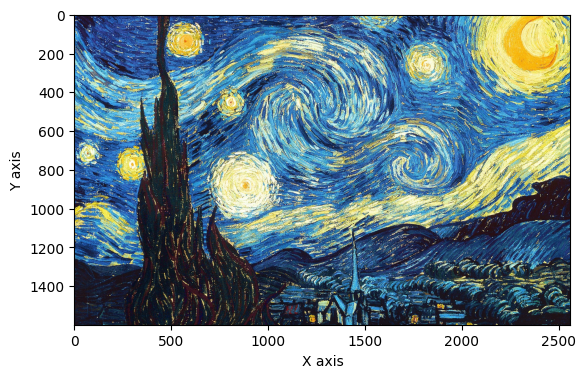

KNeighborsRegressor(n_neighbors=4, weights='distance')

In [12]:
X, Y = read_style_image(os.path.join(path, '/kaggle/input/style-1/style (1).jpg')) # 建立映射

# weights='distance'表示邻居的权重与其到样本的距离成反比
knn = KNeighborsRegressor(n_neighbors=4, weights='distance')
knn.fit(X, Y)


In [13]:
def rebuild(img, size=block_size):
    # 打印内容图像
    fig = plt.figure()
    plt.imshow(img)
    plt.xlabel('X axis')
    plt.ylabel('Y axis')
    plt.show()
    
    # 将内容图像转为LAB表示
    img = rgb2lab(img) 
    w, h = img.shape[:2]
    
    # 初始化输出图像对应的矩阵
    photo = np.zeros([w, h, 3])
    # 枚举内容图像的中心点，保存所有窗口
    print('Constructing window...')
    X = []
    for x in range(size, w - size):
        for y in range(size, h - size):
            # 得到中心点对应的窗口
            window = img[x - size: x + size + 1, \
                y - size: y + size + 1, 0].flatten()
            X.append(window)
    X = np.array(X)

    # 用KNN回归器预测颜色
    print('Predicting...')
    pred_ab = knn.predict(X).reshape(w - 2 * size, h - 2 * size, -1)
    # 设置输出图像
    photo[:, :, 0] = img[:, :, 0]
    photo[size: w - size, size: h - size, 1:] = pred_ab
    
    # 由于最外面size层无法构造窗口，简单起见，我们直接把这些像素裁剪掉
    photo = photo[size: w - size, size: h - size, :]
    return photo

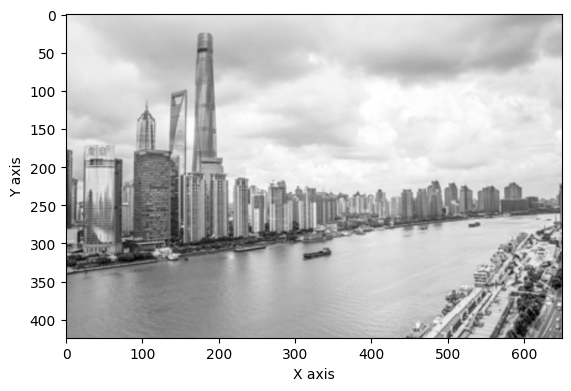

Constructing window...
Predicting...


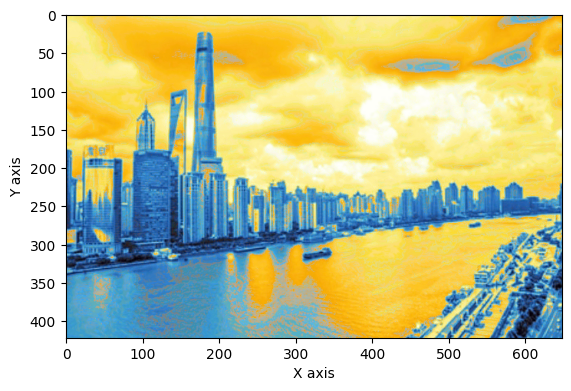

In [14]:
content = io.imread(os.path.join(path, '/kaggle/input/input3/input.jpg'))
new_photo = rebuild(content)
# 为了展示图像，我们将其再转换为RGB表示
new_photo = lab2rgb(new_photo)

fig = plt.figure()
plt.imshow(new_photo)
plt.xlabel('X axis')
plt.ylabel('Y axis')
plt.show()

# **4线性回归**

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from sklearn.preprocessing import StandardScaler

# 从源文件加载数据，并输出查看数据的各项特征
lines = np.loadtxt('/kaggle/input/househouse/USA_Housing.csv', delimiter=',', dtype='str')
header = lines[0]
lines = lines[1:].astype(float)
print('数据特征：', ', '.join(header[:-1]))
print('数据标签：', header[-1])
print('数据总条数：', len(lines))

# 划分训练集与测试集
ratio = 0.8
split = int(len(lines) * ratio)
np.random.seed(0)
lines = np.random.permutation(lines)
train, test = lines[:split], lines[split:]

# 数据归一化
scaler = StandardScaler()
scaler.fit(train) # 只使用训练集的数据计算均值和方差
train = scaler.transform(train)
test = scaler.transform(test)

# 划分输入和标签
x_train, y_train = train[:, :-1], train[:, -1].flatten()
x_test, y_test = test[:, :-1], test[:, -1].flatten()

数据特征： Avg. Area Income, Avg. Area House Age, Avg. Area Number of Rooms, Avg. Area Number of Bedrooms, Area Population
数据标签： Price
数据总条数： 5000


In [16]:
# 在X矩阵最后添加一列1，代表常数项
X = np.concatenate([x_train, np.ones((len(x_train), 1))], axis=-1)
# @ 表示矩阵相乘，X.T表示矩阵X的转置，np.linalg.inv函数可以计算矩阵的逆
theta = np.linalg.inv(X.T @ X) @ X.T @ y_train
print('回归系数：', theta)

# 在测试集上使用回归系数进行预测
X_test = np.concatenate([x_test, np.ones((len(x_test), 1))], axis=-1)
y_pred = X_test @ theta

# 计算预测值和真实值之间的RMSE
rmse_loss = np.sqrt(np.square(y_test - y_pred).mean())
print('RMSE：', rmse_loss)

回归系数： [ 6.50881254e-01  4.67222833e-01  3.38466198e-01  6.17275856e-03
  4.26857089e-01 -1.46445356e-14]
RMSE： 0.28791834247503534


In [17]:
from sklearn.linear_model import LinearRegression

# 初始化线性模型
linreg = LinearRegression()
# LinearRegression的方法中已经考虑了线性回归的常数项，所以无须再拼接1
linreg.fit(x_train, y_train)

# coef_是训练得到的回归系数，intercept_是常数项
print('回归系数：', linreg.coef_, linreg.intercept_)
y_pred = linreg.predict(x_test)

# 计算预测值和真实值之间的RMSE
rmse_loss = np.sqrt(np.square(y_test - y_pred).mean())
print('RMSE：', rmse_loss)

回归系数： [0.65088125 0.46722283 0.3384662  0.00617276 0.42685709] -1.4635041882766192e-14
RMSE： 0.28791834247503534


In [18]:
# 该函数每次返回大小为batch_size的批量
# x和y分别为输入和标签
# 若shuffle = True，则每次遍历时会将数据重新随机划分
def batch_generator(x, y, batch_size, shuffle=True):
    # 批量计数器
    batch_count = 0
    if shuffle:
        # 随机生成0到len(x)-1的下标
        idx = np.random.permutation(len(x))
        x = x[idx]
        y = y[idx]
    while True:
        start = batch_count * batch_size
        end = min(start + batch_size, len(x))
        if start >= end:
            # 已经遍历一遍，结束生成
            break
        batch_count += 1
        yield x[start: end], y[start: end]

回归系数： [ 0.65357756  0.46682964  0.33885411  0.00720843  0.42751035 -0.00273407]


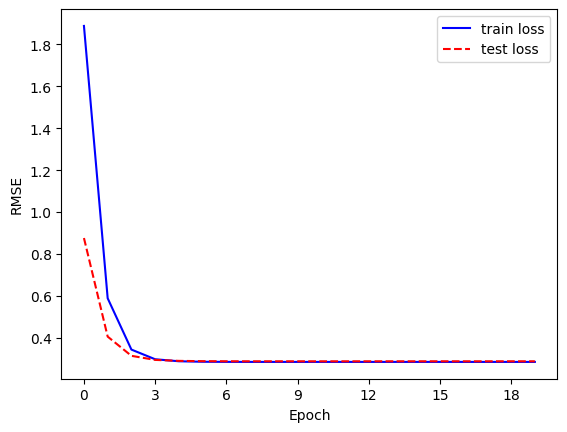

In [19]:
def SGD(num_epoch, learning_rate, batch_size):
    # 拼接原始矩阵
    X = np.concatenate([x_train, np.ones((len(x_train), 1))], axis=-1)
    X_test = np.concatenate([x_test, np.ones((len(x_test), 1))], axis=-1)
    # 随机初始化参数
    theta = np.random.normal(size=X.shape[1])

    # 随机梯度下降
    # 为了观察迭代过程，我们记录每一次迭代后在训练集和测试集上的均方根误差
    train_losses = []
    test_losses = []
    for i in range(num_epoch):
        # 初始化批量生成器
        batch_g = batch_generator(X, y_train, batch_size, shuffle=True)
        train_loss = 0
        for x_batch, y_batch in batch_g:
            # 计算梯度
            grad = x_batch.T @ (x_batch @ theta - y_batch)
            # 更新参数
            theta = theta - learning_rate * grad / len(x_batch)
            # 累加平方误差
            train_loss += np.square(x_batch @ theta - y_batch).sum()
        # 计算训练和测试误差
        train_loss = np.sqrt(train_loss / len(X))
        train_losses.append(train_loss)
        test_loss = np.sqrt(np.square(X_test @ theta - y_test).mean())
        test_losses.append(test_loss)

    # 输出结果，绘制训练曲线
    print('回归系数：', theta)
    return theta, train_losses, test_losses

# 设置迭代次数，学习率与批量大小
num_epoch = 20
learning_rate = 0.01
batch_size = 32
# 设置随机种子
np.random.seed(0)

_, train_losses, test_losses = SGD(num_epoch, learning_rate, batch_size)
    
# 将损失函数关于运行次数的关系制图，可以看到损失函数先一直保持下降，之后趋于平稳
plt.plot(np.arange(num_epoch), train_losses, color='blue', 
    label='train loss')
plt.plot(np.arange(num_epoch), test_losses, color='red', 
    ls='--', label='test loss')
# 由于epoch是整数，这里把图中的横坐标也设置为整数
# 该步骤也可以省略
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.show()

回归系数： [0.64542258 0.47047873 0.33188398 0.00325404 0.42479699 0.00237965]
回归系数： [0.59247915 0.58561574 0.26554358 0.10173112 0.49435997 0.13108641]


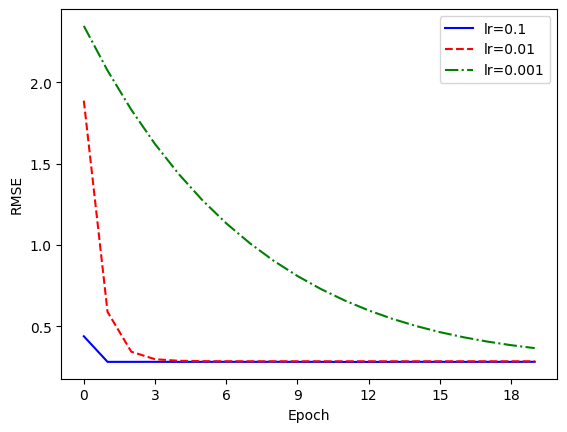

In [20]:
_, loss1, _ = SGD(num_epoch=num_epoch, learning_rate=0.1, 
    batch_size=batch_size)
_, loss2, _ = SGD(num_epoch=num_epoch, learning_rate=0.001, 
    batch_size=batch_size)
plt.plot(np.arange(num_epoch), loss1, color='blue', 
    label='lr=0.1')
plt.plot(np.arange(num_epoch), train_losses, color='red', 
    ls='--', label='lr=0.01')
plt.plot(np.arange(num_epoch), loss2, color='green',
    ls='-.', label='lr=0.001')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.legend()
plt.show()

回归系数： [ 1.02026986e+76 -1.13520942e+76  9.19402885e+75  5.66309332e+75
 -4.91083973e+75  5.35399839e+75]
最终损失： 5.336762494107758e+77


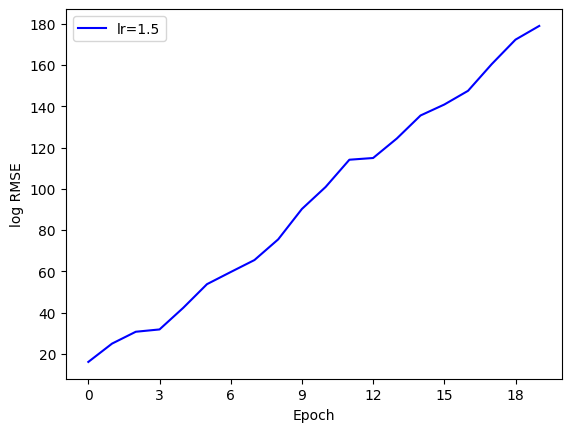

In [21]:
_, loss3, _ = SGD(num_epoch=num_epoch, learning_rate=1.5, batch_size=batch_size)
print('最终损失：', loss3[-1])
plt.plot(np.arange(num_epoch), np.log(loss3), color='blue', label='lr=1.5')
plt.xlabel('Epoch')
plt.ylabel('log RMSE')
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.legend()
plt.show()

# 6 逻辑斯谛回归

数据集大小： 1000


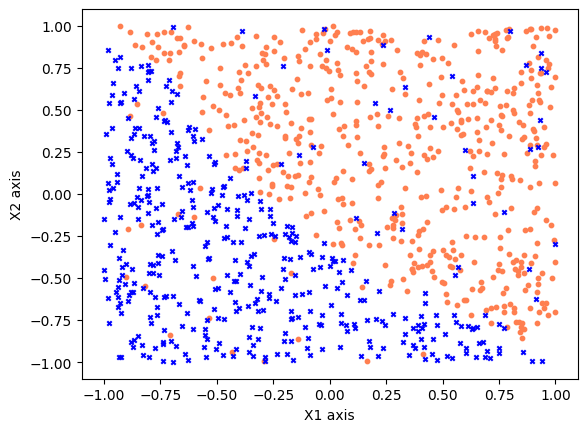

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# 从源文件中读入数据并处理
lines = np.loadtxt('/kaggle/input/lr-dataset/lr_dataset.csv', delimiter=',', dtype=float)
x_total = lines[:, 0:2]
y_total = lines[:, 2]
print('数据集大小：', len(x_total))

# 将得到的数据在二维平面上制图，不同的类别染上不同的颜色以便于观察样本点的分布
pos_index = np.where(y_total == 1)
neg_index = np.where(y_total == 0)
plt.scatter(x_total[pos_index, 0], x_total[pos_index, 1], 
    marker='o', color='coral', s=10)
plt.scatter(x_total[neg_index, 0], x_total[neg_index, 1], 
    marker='x', color='blue', s=10)
plt.xlabel('X1 axis')
plt.ylabel('X2 axis')
plt.show()

# 划分训练集与测试集
np.random.seed(0)
ratio = 0.7
split = int(len(x_total) * ratio)
idx = np.random.permutation(len(x_total))
x_total = x_total[idx]
y_total = y_total[idx]
x_train, y_train = x_total[:split], y_total[:split]
x_test, y_test = x_total[split:], y_total[split:]

In [23]:
def acc(y_true, y_pred):
    return np.mean(y_true == y_pred)

def auc(y_true, y_pred):
    # 按预测值从大到小排序，越靠前的样本预测正类概率越大
    idx = np.argsort(y_pred)[::-1]
    y_true = y_true[idx]
    y_pred = y_pred[idx]
    # 把y_pred中不重复的值当作阈值，依次计算FP样本和TP样本数量
    # 由于两个数组已经排序且位置对应，直接从前向后累加即可
    tp = np.cumsum(y_true) 
    fp = np.cumsum(1 - y_true)
    tpr = tp / tp[-1]
    fpr = fp / fp[-1]
    # 依次枚举FPR，计算曲线下的面积
    # 方便起见，给FPR和TPR最开始添加(0,0)
    s = 0.0
    tpr = np.concatenate([[0], tpr])
    fpr = np.concatenate([[0], fpr])
    for i in range(1, len(fpr)):
        s += (fpr[i] - fpr[i - 1]) * tpr[i]
    return s

In [24]:
# 逻辑斯谛函数
def logistic(z):
    return 1 / (1 + np.exp(-z))

def GD(num_steps, learning_rate, l2_coef):
    # 初始化模型参数
    theta = np.random.normal(size=(X.shape[1],))
    train_losses = []
    test_losses = []
    train_acc = []
    test_acc = []
    train_auc = []
    test_auc = []
    for i in range(num_steps):
        pred = logistic(X @ theta)
        grad = -X.T @ (y_train - pred) + l2_coef * theta
        theta -= learning_rate * grad
        # 记录损失函数
        train_loss = - y_train.T @ np.log(pred) \
                     - (1 - y_train).T @ np.log(1 - pred) \
                     + l2_coef * np.linalg.norm(theta) ** 2 / 2
        train_losses.append(train_loss / len(X))
        test_pred = logistic(X_test @ theta)
        test_loss = - y_test.T @ np.log(test_pred) \
                    - (1 - y_test).T @ np.log(1 - test_pred)
        test_losses.append(test_loss / len(X_test))
        # 记录各个评价指标，阈值采用0.5
        train_acc.append(acc(y_train, pred >= 0.5))
        test_acc.append(acc(y_test, test_pred >= 0.5))
        train_auc.append(auc(y_train, pred))
        test_auc.append(auc(y_test, test_pred))
        
    return theta, train_losses, test_losses, \
    train_acc, test_acc, train_auc, test_auc

预测准确率： 0.8766666666666667
回归系数： [3.13501827 2.90998799 0.55095127]


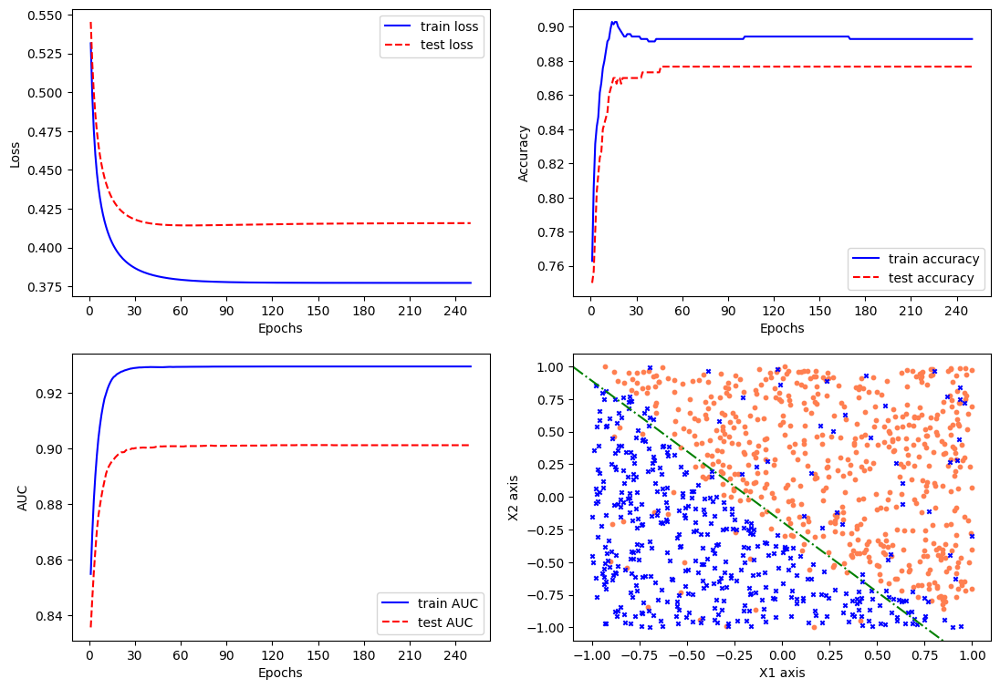

In [25]:
# 定义梯度下降迭代的次数，学习率，以及L2正则系数
num_steps = 250
learning_rate = 0.002
l2_coef = 1.0
np.random.seed(0)

# 在x矩阵上拼接1
X = np.concatenate([x_train, np.ones((x_train.shape[0], 1))], axis=1)
X_test = np.concatenate([x_test, np.ones((x_test.shape[0], 1))], axis=1) 

theta, train_losses, test_losses, train_acc, test_acc, \
    train_auc, test_auc = GD(num_steps, learning_rate, l2_coef)

# 计算测试集上的预测准确率
y_pred = np.where(logistic(X_test @ theta) >= 0.5, 1, 0)
final_acc = acc(y_test, y_pred)
print('预测准确率：', final_acc)
print('回归系数：', theta)

plt.figure(figsize=(13, 9))
xticks = np.arange(num_steps) + 1
# 绘制训练曲线
plt.subplot(221)
plt.plot(xticks, train_losses, color='blue', label='train loss')
plt.plot(xticks, test_losses, color='red', ls='--', label='test loss')
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# 绘制准确率
plt.subplot(222)
plt.plot(xticks, train_acc, color='blue', label='train accuracy')
plt.plot(xticks, test_acc, color='red', ls='--', label='test accuracy')
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# 绘制AUC
plt.subplot(223)
plt.plot(xticks, train_auc, color='blue', label='train AUC')
plt.plot(xticks, test_auc, color='red', ls='--', label='test AUC')
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.legend()

# 绘制模型学到的分隔直线
plt.subplot(224)
plot_x = np.linspace(-1.1, 1.1, 100)
# 直线方程：theta_0 * x_1 + theta_1 * x_2 + theta_2 = 0
plot_y = -(theta[0] * plot_x + theta[2]) / theta[1]
pos_index = np.where(y_total == 1)
neg_index = np.where(y_total == 0)
plt.scatter(x_total[pos_index, 0], x_total[pos_index, 1], 
    marker='o', color='coral', s=10)
plt.scatter(x_total[neg_index, 0], x_total[neg_index, 1], 
    marker='x', color='blue', s=10)
plt.plot(plot_x, plot_y, ls='-.', color='green')
plt.xlim(-1.1, 1.1)
plt.ylim(-1.1, 1.1)
plt.xlabel('X1 axis')
plt.ylabel('X2 axis')
plt.savefig('output_16_1.png')
plt.savefig('output_16_1.pdf')
plt.show()

In [26]:
from sklearn.linear_model import LogisticRegression

# 使用线性模型中的逻辑回归模型在数据集上训练
# 其提供的liblinear优化算法适合在较小数据集上使用
# 默认使用系数为1.0的L2正则化约束
# 其他可选参数请参考官方文档
lr_clf = LogisticRegression(solver='liblinear')
lr_clf.fit(x_train, y_train)
print('回归系数：', lr_clf.coef_[0], lr_clf.intercept_)

# 在数据集上用计算得到的逻辑回归模型进行预测并计算准确度
y_pred = lr_clf.predict(x_test)
print('准确率为：',np.mean(y_pred == y_test))

回归系数： [3.14129907 2.91620111] [0.5518978]
准确率为： 0.8766666666666667


# **7 双线性模型**

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm # 进度条工具

data = np.loadtxt('/kaggle/input/shuangxianxing1/movielens_100k.csv', delimiter=',', dtype=int)
print('数据集大小：', len(data))
# 用户和电影都是从1开始编号的，我们将其转化为从0开始
data[:, :2] = data[:, :2] - 1

# 计算用户和电影数量
users = set()
items = set()
for i, j, k in data:
    users.add(i)
    items.add(j)
user_num = len(users)
item_num = len(items)
print(f'用户数：{user_num}，电影数：{item_num}')

# 设置随机种子，划分训练集与测试集
np.random.seed(0)

ratio = 0.8
split = int(len(data) * ratio)
np.random.shuffle(data)
train = data[:split]
test = data[split:]

# 统计训练集中每个用户和电影出现的数量，作为正则化的权重
user_cnt = np.bincount(train[:, 0], minlength=user_num)
item_cnt = np.bincount(train[:, 1], minlength=item_num)
print(user_cnt[:10])
print(item_cnt[:10])

# 用户和电影的编号要作为下标，必须保存为整数
user_train, user_test = train[:, 0], test[:, 0]
item_train, item_test = train[:, 1], test[:, 1]
y_train, y_test = train[:, 2], test[:, 2]

数据集大小： 100000
用户数：943，电影数：1682
[215  47  42  19 139 170 320  47  18 156]
[371 109  70 172  70  21 308 158 240  68]


In [28]:
class MF:
    
    def __init__(self, N, M, d):
        # N是用户数量，M是电影数量，d是特征维度
        # 定义模型参数
        self.user_params = np.ones((N, d))
        self.item_params = np.ones((M, d))
        
    def pred(self, user_id, item_id):
        # 预测用户user_id对电影item_id的打分
        # 获得用户偏好和电影特征
        user_param = self.user_params[user_id]
        item_param = self.item_params[item_id]
        # 返回预测的评分
        rating_pred = np.sum(user_param * item_param, axis=1)
        return rating_pred
    
    def update(self, user_grad, item_grad, lr):
        # 根据参数的梯度更新参数
        self.user_params -= lr * user_grad
        self.item_params -= lr * item_grad

In [29]:
def train(model, learning_rate, lbd, max_training_step, batch_size):
    train_losses = []
    test_losses = []
    batch_num = int(np.ceil(len(user_train) / batch_size))
    with tqdm(range(max_training_step * batch_num)) as pbar:
        for epoch in range(max_training_step):
            # 随机梯度下降
            train_rmse = 0
            for i in range(batch_num):
                # 获取当前批量
                st = i * batch_size
                ed = min(len(user_train), st + batch_size)
                user_batch = user_train[st: ed]
                item_batch = item_train[st: ed]
                y_batch = y_train[st: ed]
                # 计算模型预测
                y_pred = model.pred(user_batch, item_batch)
                # 计算梯度
                P = model.user_params
                Q = model.item_params
                errs = y_batch - y_pred
                P_grad = np.zeros_like(P)
                Q_grad = np.zeros_like(Q)
                for user, item, err in zip(user_batch, item_batch, errs):
                    P_grad[user] = P_grad[user] - err * Q[item] + lbd * P[user]
                    Q_grad[item] = Q_grad[item] - err * P[user] + lbd * Q[item]
                model.update(P_grad / len(user_batch), Q_grad / len(user_batch), learning_rate)
                
                train_rmse += np.mean(errs ** 2)
                # 更新进度条
                pbar.set_postfix({
                    'Epoch': epoch,
                    'Train RMSE': f'{np.sqrt(train_rmse / (i + 1)):.4f}',
                    'Test RMSE': f'{test_losses[-1]:.4f}' if test_losses else None
                })
                pbar.update(1)

            # 计算 RMSE 损失
            train_rmse = np.sqrt(train_rmse / len(user_train))
            train_losses.append(train_rmse)
            y_test_pred = model.pred(user_test, item_test)
            test_rmse = np.sqrt(np.mean((y_test - y_test_pred) ** 2))
            test_losses.append(test_rmse)
    
    return train_losses, test_losses

100%|██████████| 37500/37500 [01:43<00:00, 361.72it/s, Epoch=29, Train RMSE=0.9673, Test RMSE=1.0048]


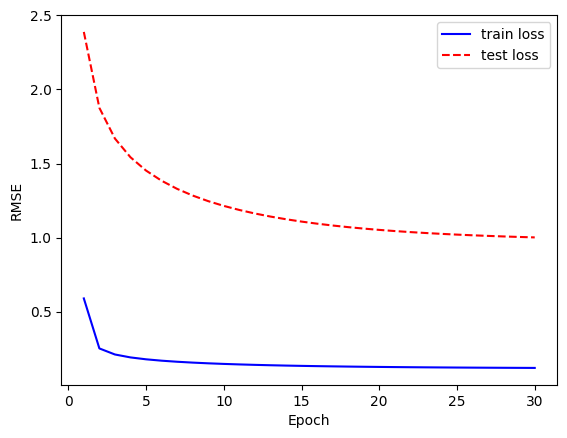

In [30]:
# 超参数
feature_num = 16 # 特征数
learning_rate = 0.1 # 学习率
lbd = 1e-4 # 正则化强度
max_training_step = 30
batch_size = 64 # 批量大小

# 建立模型
model = MF(user_num, item_num, feature_num)
# 训练部分
train_losses, test_losses = train(model, learning_rate, lbd, 
    max_training_step, batch_size)

plt.figure()
x = np.arange(max_training_step) + 1
plt.plot(x, train_losses, color='blue', label='train loss')
plt.plot(x, test_losses, color='red', ls='--', label='test loss')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [31]:
y_test_pred = model.pred(user_test, item_test)
print(y_test_pred[:10]) # 把张量转换为numpy数组
print(y_test[:10])

[2.57712395 3.48622005 3.76150216 3.58604004 4.8058418  3.47284112
 3.37246031 4.0917956  3.02605747 3.45742155]
[2 4 4 4 5 2 3 1 4 4]


In [32]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics # sklearn中的评价指标函数库
from tqdm import tqdm

# 导入数据集
data = np.loadtxt('/kaggle/input/shuangxianxing1/fm_dataset.csv', delimiter=',')

# 划分数据集
np.random.seed(0)
ratio = 0.8
split = int(ratio * len(data))
x_train = data[:split, :-1]
y_train = data[:split, -1]
x_test = data[split:, :-1]
y_test = data[split:, -1]
# 特征数
feature_num = x_train.shape[1]
print('训练集大小：', len(x_train))
print('测试集大小：', len(x_test))
print('特征数：', feature_num)

训练集大小： 800
测试集大小： 200
特征数： 24


In [33]:
class FM:

    def __init__(self, feature_num, vector_dim):
        # vector_dim代表公式中的k，为向量v的维度
        self.theta0 = 0.0 # 常数项
        self.theta = np.zeros(feature_num) # 线性参数
        self.v = np.random.normal(size=(feature_num, vector_dim)) # 双线性参数
        self.eps = 1e-6 # 精度参数
        
    def _logistic(self, x):
        # 工具函数，用于将预测转化为概率
        return 1 / (1 + np.exp(-x))

    def pred(self, x):
        # 线性部分
        linear_term = self.theta0 + x @ self.theta
        # 双线性部分
        square_of_sum = np.square(x @ self.v)
        sum_of_square = np.square(x) @ np.square(self.v)
        # 最终预测
        y_pred = self._logistic(linear_term \
            + 0.5 * np.sum(square_of_sum - sum_of_square, axis=1))
        # 为了防止后续梯度过大，对预测值进行裁剪，将其限制在某一范围内
        y_pred = np.clip(y_pred, self.eps, 1 - self.eps)
        return y_pred
    
    def update(self, grad0, grad_theta, grad_v, lr):
        self.theta0 -= lr * grad0
        self.theta -= lr * grad_theta
        self.v -= lr * grad_v

In [34]:
# 超参数设置，包括学习率、训练轮数等
vector_dim = 16
learning_rate = 0.01
lbd = 0.05
max_training_step = 200
batch_size = 32

# 初始化模型
np.random.seed(0)
model = FM(feature_num, vector_dim)

train_acc = []
test_acc = []
train_auc = []
test_auc = []

with tqdm(range(max_training_step)) as pbar:
    for epoch in pbar:
        st = 0
        while st < len(x_train):
            ed = min(st + batch_size, len(x_train))
            X = x_train[st: ed]
            Y = y_train[st: ed]
            st += batch_size
            # 计算模型预测
            y_pred = model.pred(X)
            # 计算交叉熵损失
            cross_entropy = -Y * np.log(y_pred) \
                - (1 - Y) * np.log(1 - y_pred)
            loss = np.sum(cross_entropy)
            # 计算损失函数对y的梯度，再根据链式法则得到总梯度
            grad_y = (y_pred - Y).reshape(-1, 1)
            # 计算y对参数的梯度
            # 常数项
            grad0 = np.sum(grad_y * (1 / len(X) + lbd))
            # 线性项
            grad_theta = np.sum(grad_y * (X / len(X) \
                + lbd * model.theta), axis=0)
            # 双线性项
            grad_v = np.zeros((feature_num, vector_dim))
            for i, x in enumerate(X):
                # 先计算sum(x_i * v_i)
                xv = x @ model.v
                grad_vi = np.zeros((feature_num, vector_dim))
                for s in range(feature_num):
                    grad_vi[s] += x[s] * xv - (x[s] ** 2) * model.v[s]
                grad_v += grad_y[i] * grad_vi
            grad_v = grad_v / len(X) + lbd * model.v
            model.update(grad0, grad_theta, grad_v, learning_rate)

            pbar.set_postfix({
                '训练轮数': epoch,
                '训练损失': f'{loss:.4f}',
                '训练集准确率': train_acc[-1] if train_acc else None,
                '测试集准确率': test_acc[-1] if test_acc else None
            })
        # 计算模型预测的准确率和AUC
        # 预测准确率，阈值设置为0.5
        y_train_pred = (model.pred(x_train) >= 0.5)
        acc = np.mean(y_train_pred == y_train)
        train_acc.append(acc)
        auc = metrics.roc_auc_score(y_train, y_train_pred) # sklearn中的AUC函数
        train_auc.append(auc)

        y_test_pred = (model.pred(x_test) >= 0.5)
        acc = np.mean(y_test_pred == y_test)
        test_acc.append(acc)
        auc = metrics.roc_auc_score(y_test, y_test_pred) 
        test_auc.append(auc)
            
print(f'测试集准确率：{test_acc[-1]}，\t测试集AUC：{test_auc[-1]}')

100%|██████████| 200/200 [00:59<00:00,  3.35it/s, 训练轮数=199, 训练损失=11.3006, 训练集准确率=0.816, 测试集准确率=0.785]

测试集准确率：0.79，	测试集AUC：0.7201320910484726


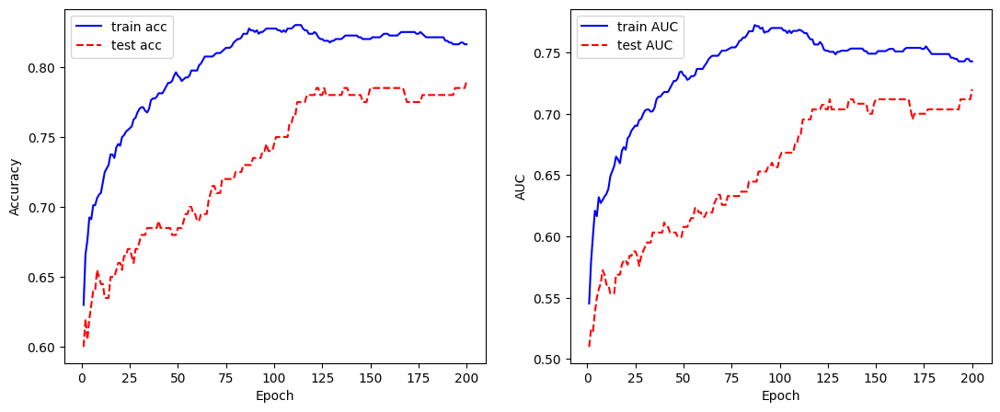

In [35]:
# 绘制训练曲线            
plt.figure(figsize=(13, 5))
x_plot = np.arange(len(train_acc)) + 1

plt.subplot(121)
plt.plot(x_plot, train_acc, color='blue', label='train acc')
plt.plot(x_plot, test_acc, color='red', ls='--', label='test acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(122)
plt.plot(x_plot, train_auc, color='blue', label='train AUC')
plt.plot(x_plot, test_auc, color='red', ls='--', label='test AUC')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.legend()
plt.show()


# 8 神经网络与多层感知机

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# 导入数据集
data = np.loadtxt('/kaggle/input/xor-data/xor_dataset.csv', delimiter=',')
print('数据集大小：', len(data))
print(data[:5])

# 划分训练集与测试集
ratio = 0.8
split = int(ratio * len(data))
np.random.seed(0)
data = np.random.permutation(data)
# y的维度调整为(len(data), 1)，与后续模型匹配
x_train, y_train = data[:split, :2], data[:split, -1].reshape(-1, 1)
x_test, y_test = data[split:, :2], data[split:, -1].reshape(-1, 1)

数据集大小： 1000
[[ 1.7641  0.4002  0.    ]
 [ 0.9787  2.2409  0.    ]
 [ 1.8676 -0.9773  1.    ]
 [ 0.9501 -0.1514  1.    ]
 [-0.1032  0.4106  1.    ]]


In [37]:
# 基类
class Layer:
    
    # 前向传播函数，根据输入x计算该层的输出y
    def forward(self, x):
        raise NotImplementedError
    
    # 反向传播函数，输入上一层回传的梯度grad，输出当前层的梯度
    def backward(self, grad):
        raise NotImplementedError
    
    # 更新函数，用于更新当前层的参数
    def update(self, learning_rate):
        pass

In [38]:
class Linear(Layer):    

    def __init__(self, num_in, num_out, use_bias=True):
        self.num_in = num_in # 输入维度
        self.num_out = num_out # 输出维度
        self.use_bias = use_bias # 是否添加偏置

        # 参数的初始化非常重要
        # 如果把参数默认设置为0，会导致Wx=0，后续计算失去意义
        # 我们直接用正态分布来初始化参数
        self.W = np.random.normal(loc=0, scale=1.0, size=(num_in, num_out))
        if use_bias: # 初始化偏置
            self.b = np.zeros((1, num_out))
        
    def forward(self, x):
        # 前向传播y = Wx + b
        # x的维度为(batch_size, num_in)
        self.x = x
        self.y = x @ self.W # y的维度为(batch_size, num_out)
        if self.use_bias:
            self.y += self.b
        return self.y
    
    def backward(self, grad):
        # 反向传播，按照链式法则计算
        # grad的维度为(batch_size, num_out)
        # 梯度要对batch_size取平均
        # grad_W的维度与W相同，为(num_in, num_out)
        self.grad_W = self.x.T @ grad / grad.shape[0]
        if self.use_bias:
            # grad_b的维度与b相同，为(1, num_out)
            self.grad_b = np.mean(grad, axis=0, keepdims=True)
        # 向前传播的grad维度为(batch_size, num_in)
        grad = grad @ self.W.T
        return grad
    
    def update(self, learning_rate):
        # 更新参数以完成梯度下降
        self.W -= learning_rate * self.grad_W
        if self.use_bias:
            self.b -= learning_rate * self.grad_b

In [39]:
class Identity(Layer):
    # 单位函数

    def forward(self, x):
        return x

    def backward(self, grad):
        return grad


class Sigmoid(Layer):  
    # 逻辑斯谛函数

    def forward(self, x):
        self.x = x
        self.y = 1 / (1 + np.exp(-x))
        return self.y
    
    def backward(self, grad):
        return grad * self.y * (1 - self.y)


class Tanh(Layer):
    # tanh函数

    def forward(self, x):
        self.x = x
        self.y = np.tanh(x)
        return self.y

    def backward(self, grad):
        return grad * (1 - self.y ** 2)


class ReLU(Layer):
    # ReLU函数

    def forward(self, x):
        self.x = x
        self.y = np.maximum(x, 0)
        return self.y

    def backward(self, grad):
        return grad * (self.x >= 0)


    
# 存储所有激活函数和对应名称，方便索引
activation_dict = { 
    'identity': Identity,
    'sigmoid': Sigmoid,
    'tanh': Tanh,
    'relu': ReLU
}

In [40]:
class MLP:

    def __init__(
        self, 
        layer_sizes, # 包含每层大小的list
        use_bias=True, 
        activation='relu',
        out_activation='identity'
    ):
        self.layers = []
        num_in = layer_sizes[0]
        for num_out in layer_sizes[1: -1]:
            # 添加全连接层
            self.layers.append(Linear(num_in, num_out, use_bias)) 
            # 添加激活函数
            self.layers.append(activation_dict[activation]()) 
            num_in = num_out
        # 由于输出需要满足任务的一些要求
        # 例如二分类任务需要输出[0,1]之间的概率值
        # 因此最后一层通常做特殊处理
        self.layers.append(Linear(num_in, layer_sizes[-1], use_bias))
        self.layers.append(activation_dict[out_activation]())
        
    def forward(self, x):
        # 前向传播，将输入依次通过每一层
        for layer in self.layers:
            x = layer.forward(x)
        return x
    
    def backward(self, grad):
        # 反向传播，grad为损失函数对输出的梯度
        # 将该梯度依次回传，得到每一层参数的梯度
        for layer in reversed(self.layers):
            grad = layer.backward(grad)
            
    def update(self, learning_rate):
        # 更新每一层的参数
        for layer in self.layers:
            layer.update(learning_rate)

测试精度： 0.97


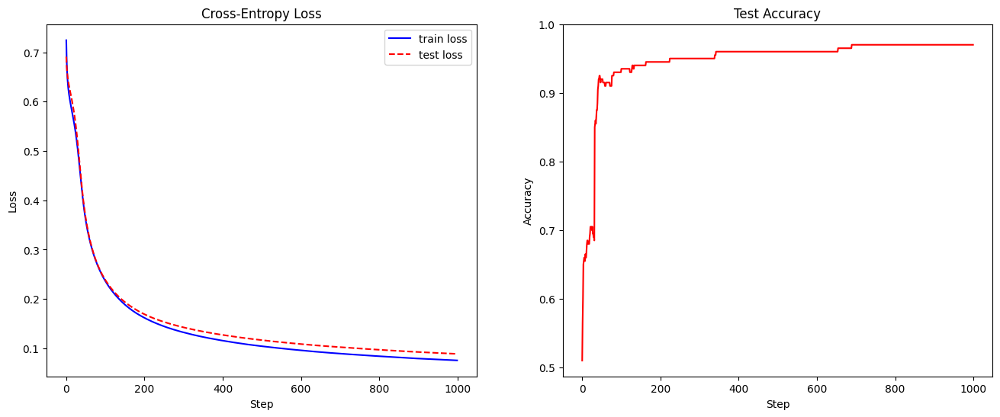

In [41]:
# 设置超参数
num_epochs = 1000
learning_rate = 0.1
batch_size = 128
eps=1e-7 # 用于防止除以0、log(0)等数学问题

# 创建一个层大小依次为[2, 4, 1]的多层感知机
# 对于二分类任务，我们用sigmoid作为输出层的激活函数，使其输出在[0,1]之间
mlp = MLP(layer_sizes=[2, 4, 1], use_bias=True, out_activation='sigmoid')

# 训练过程
losses = []
test_losses = []
test_accs = []
for epoch in range(num_epochs):
    # 我们实现的MLP支持批量输入，因此采用SGD算法
    st = 0
    loss = 0.0
    while True:
        ed = min(st + batch_size, len(x_train))
        if st >= ed:
            break
        # 取出batch
        x = x_train[st: ed]
        y = y_train[st: ed]
        # 计算MLP的预测
        y_pred = mlp.forward(x)
        # 计算梯度∂J/∂y
        grad = (y_pred - y) / (y_pred * (1 - y_pred) + eps)
        # 反向传播
        mlp.backward(grad)
        # 更新参数
        mlp.update(learning_rate)
        # 计算交叉熵损失
        train_loss = np.sum(-y * np.log(y_pred + eps) \
            - (1 - y) * np.log(1 - y_pred + eps))
        loss += train_loss
        st += batch_size

    losses.append(loss / len(x_train))
    # 计算测试集上的交叉熵和精度
    y_pred = mlp.forward(x_test)
    test_loss = np.sum(-y_test * np.log(y_pred + eps) \
        - (1 - y_test) * np.log(1 - y_pred + eps)) / len(x_test)
    test_acc = np.sum(np.round(y_pred) == y_test) / len(x_test)
    test_losses.append(test_loss)
    test_accs.append(test_acc)
    
print('测试精度：', test_accs[-1])
# 将损失变化进行可视化
plt.figure(figsize=(16, 6))
plt.subplot(121)
plt.plot(losses, color='blue', label='train loss')
plt.plot(test_losses, color='red', ls='--', label='test loss')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.title('Cross-Entropy Loss')
plt.legend()

plt.subplot(122)
plt.plot(test_accs, color='red')
plt.ylim(top=1.0)
plt.xlabel('Step')
plt.ylabel('Accuracy')
plt.title('Test Accuracy')
plt.show()

In [42]:
import torch # PyTorch库
import torch.nn as nn # PyTorch中与神经网络相关的工具
from torch.nn.init import normal_ # 正态分布初始化

torch_activation_dict = {
    'identity': lambda x: x,
    'sigmoid': torch.sigmoid,
    'tanh': torch.tanh,
    'relu': torch.relu
}

# 定义MLP类，基于PyTorch的自定义模块通常都继承nn.Module
# 继承后，只需要实现forward函数，进行前向传播
# 反向传播与梯度计算均由PyTorch自动完成
class MLP_torch(nn.Module):

    def __init__(
        self, 
        layer_sizes, # 包含每层大小的list
        use_bias=True, 
        activation='relu',
        out_activation='identity'
    ):
        super().__init__() # 初始化父类
        self.activation = torch_activation_dict[activation]
        self.out_activation = torch_activation_dict[out_activation]
        self.layers = nn.ModuleList() # ModuleList以列表方式存储PyTorch模块
        num_in = layer_sizes[0]
        for num_out in layer_sizes[1:]:
            # 创建全连接层
            self.layers.append(nn.Linear(num_in, num_out, bias=use_bias))
            # 正态分布初始化，采用与前面手动实现时相同的方式
            normal_(self.layers[-1].weight, std=1.0)
            # 偏置项为全0
            self.layers[-1].bias.data.fill_(0.0)
            num_in = num_out

    def forward(self, x):
        # 前向传播
        # PyTorch可以自行处理batch_size等维度问题
        # 我们只需要让输入依次通过每一层即可
        for i in range(len(self.layers) - 1):
            x = self.layers[i](x)
            x = self.activation(x)
        # 输出层
        x = self.layers[-1](x)
        x = self.out_activation(x)
        return x

测试精度： 0.965


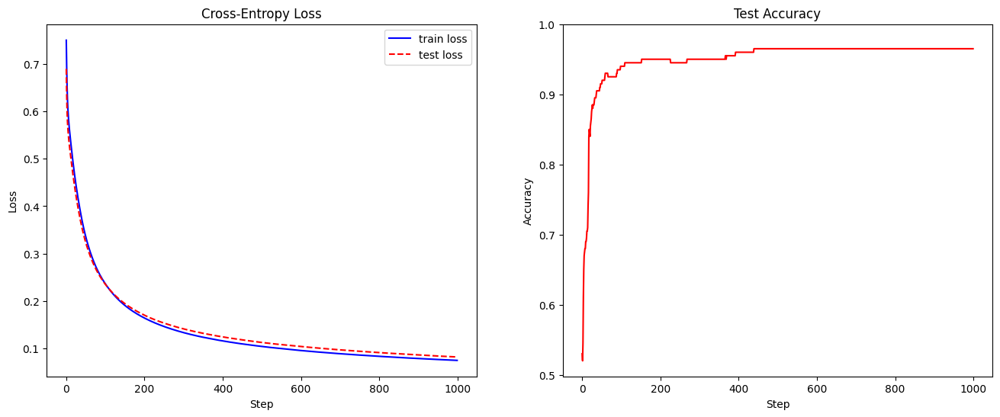

In [43]:
# 设置超参数
num_epochs = 1000
learning_rate = 0.1
batch_size = 128
eps = 1e-7
torch.manual_seed(0)

# 初始化MLP模型
mlp = MLP_torch(layer_sizes=[2, 4, 1], use_bias=True, 
    out_activation='sigmoid')

# 定义SGD优化器
opt = torch.optim.SGD(mlp.parameters(), lr=learning_rate)

# 训练过程
losses = []
test_losses = []
test_accs = []
for epoch in range(num_epochs):
    st = 0
    loss = []
    while True:
        ed = min(st + batch_size, len(x_train))
        if st >= ed:
            break
        # 取出batch，转为张量
        x = torch.tensor(x_train[st: ed], 
            dtype=torch.float32)
        y = torch.tensor(y_train[st: ed], 
            dtype=torch.float32).reshape(-1, 1)
        # 计算MLP的预测
        # 调用模型时，PyTorch会自动调用模型的forward方法
        # y_pred的维度为(batch_size, layer_sizes[-1])
        y_pred = mlp(x)
        # 计算交叉熵损失
        train_loss = torch.mean(-y * torch.log(y_pred + eps) \
            - (1 - y) * torch.log(1 - y_pred + eps))
        # 清空梯度
        opt.zero_grad()
        # 反向传播
        train_loss.backward()
        # 更新参数
        opt.step()

        # 记录累加损失，需要先将损失从张量转为numpy格式
        loss.append(train_loss.detach().numpy())
        st += batch_size

    losses.append(np.mean(loss))
    # 计算测试集上的交叉熵
    # 在不需要梯度的部分，可以用torch.inference_mode()加速计算
    with torch.inference_mode():
        x = torch.tensor(x_test, dtype=torch.float32)
        y = torch.tensor(y_test, dtype=torch.float32).reshape(-1, 1)
        y_pred = mlp(x)
        test_loss = torch.sum(-y * torch.log(y_pred + eps) \
            - (1 - y) * torch.log(1 - y_pred + eps)) / len(x_test)
        test_acc = torch.sum(torch.round(y_pred) == y) / len(x_test)
        test_losses.append(test_loss.detach().numpy())
        test_accs.append(test_acc.detach().numpy())

print('测试精度：', test_accs[-1])
# 将损失变化进行可视化
plt.figure(figsize=(16, 6))
plt.subplot(121)
plt.plot(losses, color='blue', label='train loss')
plt.plot(test_losses, color='red', ls='--', label='test loss')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.title('Cross-Entropy Loss')
plt.legend()

plt.subplot(122)
plt.plot(test_accs, color='red')
plt.ylim(top=1.0)
plt.xlabel('Step')
plt.ylabel('Accuracy')
plt.title('Test Accuracy')
plt.show()

# 9 卷积神经网络

100%|██████████| 170498071/170498071 [00:02<00:00, 82189302.90it/s]


Extracting ./cifar10/cifar-10-python.tar.gz to ./cifar10
Files already downloaded and verified
训练集大小： 50000
测试集大小： 10000


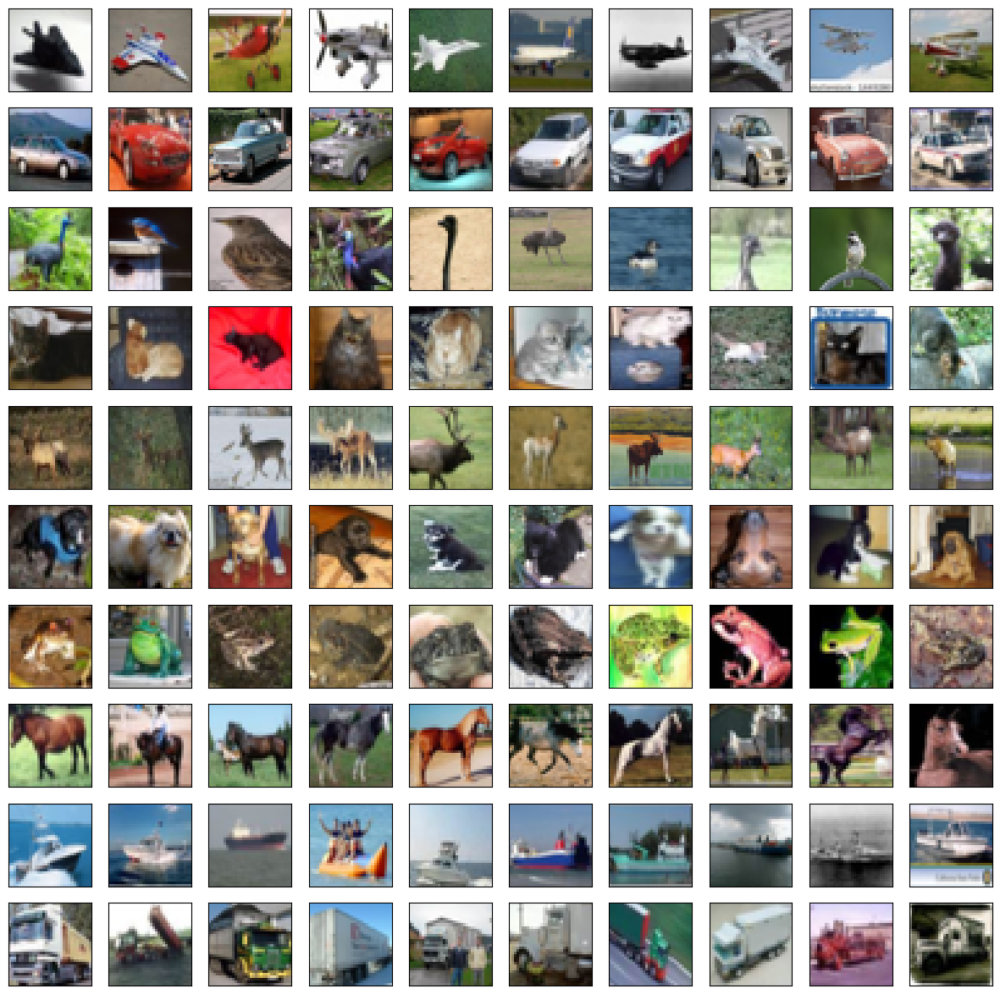

In [44]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm # 进度条工具

import torch
import torch.nn as nn
import torch.nn.functional as F
# transforms提供了数据处理工具
import torchvision.transforms as transforms 
# 由于数据集较大，我们通过工具在线下载数据集
from torchvision.datasets import CIFAR10 
from torch.utils.data import DataLoader
# 下载训练集和测试集
data_path = './cifar10'
trainset = CIFAR10(root=data_path, train=True, 
    download=True, transform=transforms.ToTensor())
testset = CIFAR10(root=data_path, train=False, 
    download=True, transform=transforms.ToTensor())
print('训练集大小：', len(trainset))
print('测试集大小：', len(testset))
# trainset和testset可以直接用下标访问
# 每个样本为一个元组 (data, label)
# data是3*32*32的Tensor，表示图像
# label是0-9之间的整数，代表图像的类别

# 可视化数据集
num_classes = 10
fig, axes = plt.subplots(num_classes, 10, figsize=(15, 15))
labels = np.array([t[1] for t in trainset]) # 取出所有样本的标签
for i in range(num_classes):
    indice = np.where(labels == i)[0] # 类别为i的图像的下标
    for j in range(10): # 展示前10张图像
        # matplotlib绘制RGB图像时
        # 图像矩阵依次是宽、高、颜色，与数据集中有差别
        # 因此需要用permute重排数据的坐标轴
        axes[i][j].imshow(trainset[indice[j]][0].permute(1, 2, 0).numpy())
        # 去除坐标刻度
        axes[i][j].set_xticks([]) 
        axes[i][j].set_yticks([])
plt.show()

In [45]:
class CNN(nn.Module):

    def __init__(self, num_classes=10):
        super().__init__()
        # 类别数目
        self.num_classes = num_classes
        # Conv2D为二维卷积层，参数依次为
        # in_channels：输入通道
        # out_channels：输出通道，即卷积核个数
        # kernel_size：卷积核大小，默认为正方形
        # padding：填充层数，padding=1表示对输入四周各填充一层，默认填充0
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, 
            kernel_size=3, padding=1)
        # 第二层卷积，输入通道与上一层的输出通道保持一致
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)
        # 最大池化，kernel_size表示窗口大小，默认为正方形
        self.pooling1 = nn.MaxPool2d(kernel_size=2)
        # 丢弃层，p表示每个位置被置为0的概率
        # 随机丢弃只在训练时开启，在测试时应当关闭
        self.dropout1 = nn.Dropout(p=0.25)
        
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv4 = nn.Conv2d(64, 64, 3, padding=1)
        self.pooling2 = nn.MaxPool2d(2)
        self.dropout2 = nn.Dropout(0.25)

        # 全连接层，输入维度4096=64*8*8，与上一层的输出一致
        self.fc1 = nn.Linear(4096, 512)
        self.dropout3 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, num_classes)

    # 前向传播，将输入按顺序依次通过设置好的层
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.pooling1(x)
        x = self.dropout1(x)

        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.pooling2(x)
        x = self.dropout2(x)

        # 全连接层之前，将x的形状转为 (batch_size, n)
        x = x.view(len(x), -1)
        x = F.relu(self.fc1(x))
        x = self.dropout3(x)
        x = self.fc2(x)
        return x
batch_size = 64 # 批量大小
learning_rate = 1e-3 # 学习率
epochs = 5 # 训练轮数
np.random.seed(0)
torch.manual_seed(0)

# 批量生成器
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
testloader = DataLoader(testset, batch_size=batch_size, shuffle=False)

model = CNN()
# 使用Adam优化器
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
# 使用交叉熵损失
criterion = F.cross_entropy

# 开始训练
for epoch in range(epochs):
    losses = 0
    accs = 0
    num = 0
    model.train() # 将模型设置为训练模式，开启dropout
    with tqdm(trainloader) as pbar:
        for data in pbar:
            images, labels = data
            outputs = model(images) # 获取输出
            loss = criterion(outputs, labels) # 计算损失
            # 优化
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            # 累积损失
            num += len(labels)
            losses += loss.detach().numpy() * len(labels)
            # 精确度
            accs += (torch.argmax(outputs, dim=-1) \
                == labels).sum().detach().numpy()
            pbar.set_postfix({
                'Epoch': epoch, 
                'Train loss': f'{losses / num:.3f}', 
                'Train acc': f'{accs / num:.3f}'
            })
    
    # 计算模型在测试集上的表现
    losses = 0
    accs = 0
    num = 0
    model.eval() # 将模型设置为评估模式，关闭dropout
    with tqdm(testloader) as pbar:
        for data in pbar:
            images, labels = data
            outputs = model(images)
            loss = criterion(outputs, labels)
            num += len(labels)
            losses += loss.detach().numpy() * len(labels)
            accs += (torch.argmax(outputs, dim=-1) \
                == labels).sum().detach().numpy()
            pbar.set_postfix({
                'Epoch': epoch, 
                'Test loss': f'{losses / num:.3f}', 
                'Test acc': f'{accs / num:.3f}'
            })

100%|██████████| 157/157 [00:07<00:00, 21.88it/s, Epoch=4, Test loss=0.828, Test acc=0.708]


内容图像


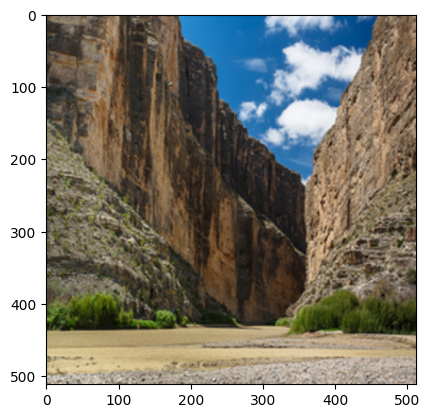

风格图像


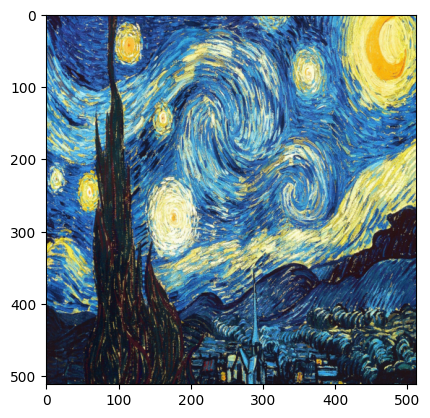

In [46]:
# 该工具包中有AlexNet、VGG等多种训练好的CNN网络
from torchvision import models 
import copy

# 定义图像处理方法
transform = transforms.Resize([512, 512]) # 规整图像形状

def loadimg(path):  
    # 加载路径为path的图像，形状为H*W*C
    img = plt.imread(path)
    # 处理图像，注意重排维度使通道维在最前
    img = transform(torch.tensor(img).permute(2, 0, 1))
    # 展示图像
    plt.imshow(img.permute(1, 2, 0).numpy())
    plt.show()
    # 添加batch size维度
    img = img.unsqueeze(0).to(dtype=torch.float32)
    img /= 255 # 将其值从0-255的整数转换为0-1的浮点数
    return img

content_image_path = os.path.join('/kaggle/input/stylejpg/04.jpg')
style_image_path = os.path.join('/kaggle/input/stylejpg/style.jpg')

# 加载内容图像
print('内容图像')
content_img = loadimg(content_image_path)
# 加载风格图像
print('风格图像') 
style_img = loadimg(style_image_path)

In [47]:
# 内容损失
class ContentLoss(nn.Module):

    def __init__(self, target):
        # target为从目标图像中提取的内容特征
        super().__init__()
        # 我们不对target求梯度，因此将target从梯度的计算图中分离出来
        self.target = target.detach() 
        self.criterion = nn.MSELoss()

    def forward(self, x):
         # 利用MSE计算输入图像与目标内容图像之间的损失
        self.loss = self.criterion(x.clone(), self.target) 
        return x # 只计算损失，不改变输入

    def backward(self): 
        # 由于本模块只包含损失计算，不改变输入，因此要单独定义反向传播
        self.loss.backward(retain_graph=True)
        return self.loss


def gram(x):
    # 计算G矩阵
    batch_size, n, w, h = x.shape # n为卷积核数目，w和h为输出的宽和高
    f = x.view(batch_size * n, w * h) # 变换为二维
    g = f @ f.T / (batch_size * n * w * h) # 除以参数数目，进行归一化
    return g


# 风格损失
class StyleLoss(nn.Module):

    def __init__(self, target):
        # target为从目标图像中提取的风格特征
        # weight为设置的强度系数lambda
        super().__init__()
        self.target_gram = gram(target.detach()) # 目标的Gram矩阵
        self.criterion = nn.MSELoss()

    def forward(self, x):
        input_gram = gram(x.clone()) # 输入的Gram矩阵
        self.loss = self.criterion(input_gram, self.target_gram)
        return x

    def backward(self):
        self.loss.backward(retain_graph=True)
        return self.loss

In [48]:
vgg16 = models.vgg16(weights=True).features # 导入预训练的VGG16网络

# 选定用于提取特征的卷积层，Conv_13对应着第5块的第3卷积层
content_layer = ['Conv_13']
# 下面这些层分别对应第1至5块的第1卷积层
style_layer = ['Conv_1', 'Conv_3', 'Conv_5', 'Conv_8', 'Conv_11']

content_losses = [] # 内容损失
style_losses = [] # 风格损失

model = nn.Sequential() # 储存新模型的层
vgg16 = copy.deepcopy(vgg16)
index = 1  # 计数卷积层

# 遍历 VGG16 的网络结构，选取需要的层
for layer in list(vgg16):
    if isinstance(layer, nn.Conv2d): # 如果是卷积层
        name = "Conv_" + str(index)
        model.append(layer)
        if name in content_layer:  
            # 如果当前层用于抽取内容特征，则添加内容损失
            target = model(content_img).clone() # 计算内容图像的特征
            content_loss = ContentLoss(target) # 内容损失模块
            model.append(content_loss)
            content_losses.append(content_loss)

        if name in style_layer:  
            # 如果当前层用于抽取风格特征，则添加风格损失
            target = model(style_img).clone()
            style_loss = StyleLoss(target) # 风格损失模块
            model.append(style_loss)  
            style_losses.append(style_loss) 

    if isinstance(layer, nn.ReLU): # 如果激活函数层
        model.append(layer)
        index += 1

    if isinstance(layer, nn.MaxPool2d): # 如果是池化层
        model.append(layer)

# 输出模型结构
print(model)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 189MB/s]


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): StyleLoss(
    (criterion): MSELoss()
  )
  (2): ReLU(inplace=True)
  (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): ReLU(inplace=True)
  (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): StyleLoss(
    (criterion): MSELoss()
  )
  (8): ReLU(inplace=True)
  (9): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (10): ReLU(inplace=True)
  (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): StyleLoss(
    (criterion): MSELoss()
  )
  (14): ReLU(inplace=True)
  (15): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (16): ReLU(inplace=True)
  (17): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1

训练轮数：0,	风格损失：6997.6050,	内容损失：0.0000


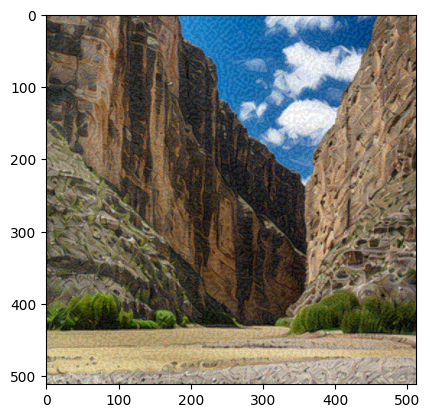

训练轮数：10,	风格损失：2274.9868,	内容损失：5.0094


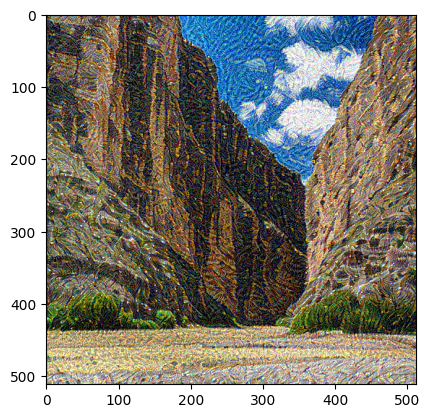

训练轮数：20,	风格损失：774.6899,	内容损失：5.1203


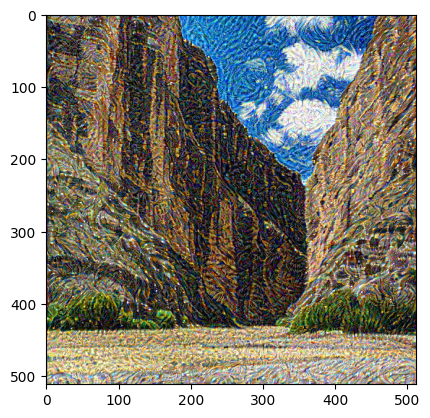

训练轮数：30,	风格损失：242.6750,	内容损失：4.4150


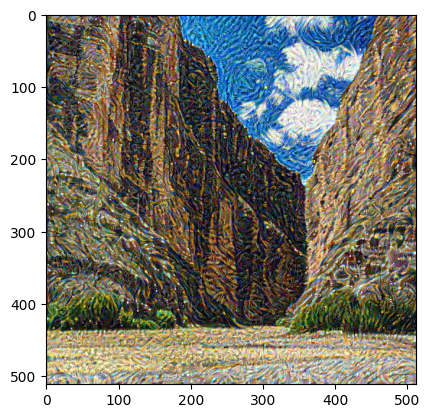

训练轮数：40,	风格损失：101.1478,	内容损失：3.9600


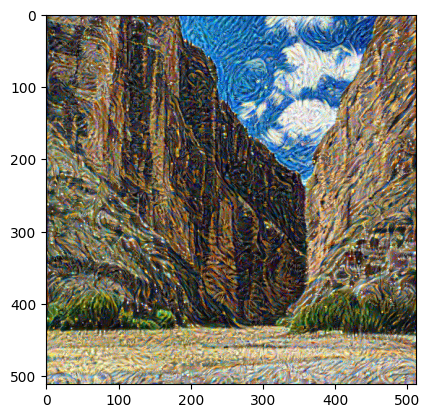

训练轮数：49,	风格损失：59.7735,	内容损失：3.5707


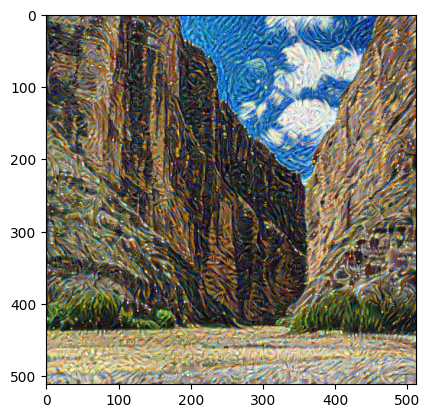

In [49]:
epochs = 50
learning_rate = 0.05
lbd = 1e6 # 强度系数

input_img = content_img.clone() # 从内容图像开始迁移
param = nn.Parameter(input_img.data) # 将图像内容设置为可训练的参数
optimizer = torch.optim.Adam([param], lr=learning_rate) # 使用Adam优化器

for i in range(epochs):
    style_score = 0  # 本轮的风格损失
    content_score = 0  # 本轮的内容损失
    model(param) # 将输入通过模型，得到损失
    for cl in content_losses:  
        content_score += cl.backward()
    for sl in style_losses:  
        style_score += sl.backward()
    style_score *= lbd
    loss = content_score + style_score
    # 更新输入图像
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    # 每次对输入图像进行更新后
    # 图像中部分像素点会超出0-1的范围
    # 因此要对其进行剪切
    param.data.clamp_(0, 1) 

    if i % 10 == 0 or i == epochs - 1:
        print(f'训练轮数：{i},\t风格损失：{style_score.item():.4f},\t' \
            f'内容损失：{content_score.item():.4f}')
        plt.imshow(input_img[0].permute(1, 2, 0).numpy())
        plt.show()

# 10 循环神经网络

数据集大小：1000


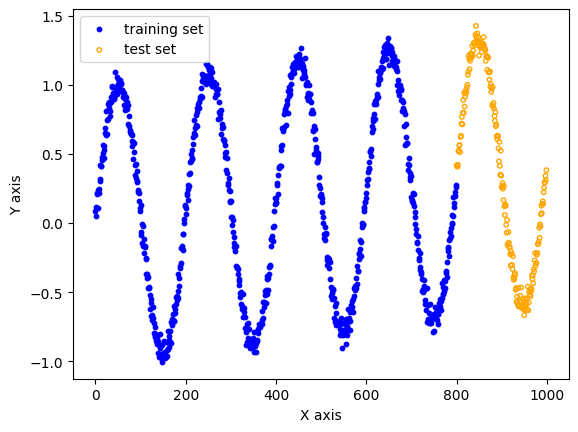

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn

# 导入数据集
data = np.loadtxt('/kaggle/input/sindata-10000/sindata_1000.csv', delimiter=',')
num_data = len(data)
split = int(0.8 * num_data)
print(f'数据集大小：{num_data}')
# 数据集可视化
plt.figure()
plt.scatter(np.arange(split), data[:split], color='blue', 
    s=10, label='training set')
plt.scatter(np.arange(split, num_data), data[split:], color='none', 
    edgecolor='orange', s=10, label='test set')
plt.xlabel('X axis')
plt.ylabel('Y axis')
plt.legend()
plt.show()
# 分割数据集
train_data = np.array(data[:split])
test_data = np.array(data[split:])

In [51]:
# 输入序列长度
seq_len = 20
# 处理训练数据，把切分序列后多余的部分去掉
train_num = len(train_data) // (seq_len + 1) * (seq_len + 1)
train_data = np.array(train_data[:train_num]).reshape(-1, seq_len + 1, 1)
np.random.seed(0)
torch.manual_seed(0)

x_train = train_data[:, :seq_len] # 形状为(num_data, seq_len, input_size)
y_train = train_data[:, 1: seq_len + 1]
print(f'训练序列数：{len(x_train)}')

# 转为PyTorch张量
x_train = torch.from_numpy(x_train).to(torch.float32)
y_train = torch.from_numpy(y_train).to(torch.float32)
x_test = torch.from_numpy(test_data[:-1]).to(torch.float32)
y_test = torch.from_numpy(test_data[1:]).to(torch.float32)

训练序列数：38


In [52]:
class GRU(nn.Module):
    # 包含PyTorch的GRU和拼接的MLP
    def __init__(self, input_size, output_size, hidden_size):
        super().__init__()
        # GRU模块
        self.gru = nn.GRU(input_size=input_size, hidden_size=hidden_size) 
        # 将中间变量映射到预测输出的MLP
        self.linear = nn.Linear(hidden_size, output_size)
        
    def forward(self, x, hidden):
        # 前向传播
        # x的维度为(batch_size, seq_len, input_size)
        # GRU模块接受的输入为(seq_len, batch_size, input_size)
        # 因此需要对x进行变换
        # transpose函数可以交换x的坐标轴
        # out的维度是(seq_len, batch_size, hidden_size)
        out, hidden = self.gru(torch.transpose(x, 0, 1), hidden) 
        # 取序列最后的中间变量输入给全连接层
        out = self.linear(out.view(-1, hidden_size))
        return out, hidden

In [53]:
# 超参数
input_size = 1 # 输入维度
output_size = 1 # 输出维度
hidden_size = 16 # 中间变量维度
learning_rate = 5e-4

# 初始化网络
gru = GRU(input_size, output_size, hidden_size)
gru_optim = torch.optim.Adam(gru.parameters(), lr=learning_rate)

# GRU测试函数，x和hidden分别是初始的输入和中间变量
def test_gru(gru, x, hidden, pred_steps):
    pred = []
    inp = x.view(-1, input_size)
    for i in range(pred_steps):
        gru_pred, hidden = gru(inp, hidden)
        pred.append(gru_pred.detach())
        inp = gru_pred
    return torch.concat(pred).reshape(-1)

In [54]:
# MLP的超参数
hidden_1 = 32
hidden_2 = 16
mlp = nn.Sequential(
    nn.Linear(input_size, hidden_1),
    nn.ReLU(),
    nn.Linear(hidden_1, hidden_2),
    nn.ReLU(),
    nn.Linear(hidden_2, output_size)
)
mlp_optim = torch.optim.Adam(mlp.parameters(), lr=learning_rate)

# MLP测试函数，相比于GRU少了中间变量
def test_mlp(mlp, x, pred_steps):
    pred = []
    inp = x.view(-1, input_size)
    for i in range(pred_steps):
        mlp_pred = mlp(inp)
        pred.append(mlp_pred.detach())
        inp = mlp_pred
    return torch.concat(pred).reshape(-1)

In [55]:
max_epoch = 150
criterion = nn.functional.mse_loss
hidden = None # GRU的中间变量

# 训练损失
gru_losses = []
mlp_losses = []
gru_test_losses = []
mlp_test_losses = []
# 开始训练
with tqdm(range(max_epoch)) as pbar:
    for epoch in pbar:
        st = 0
        gru_loss = 0.0
        mlp_loss = 0.0
        # 随机梯度下降
        for X, y in zip(x_train, y_train):
            # 更新GRU模型
            # 我们不需要通过梯度回传更新中间变量
            # 因此将其从有梯度的部分分离出来
            if hidden is not None:
                hidden.detach_()
            gru_pred, hidden = gru(X[None, ...], hidden)
            gru_train_loss = criterion(gru_pred.view(y.shape), y)
            gru_optim.zero_grad()
            gru_train_loss.backward()
            gru_optim.step()
            gru_loss += gru_train_loss.item()
            # 更新MLP模型
            # 需要对输入的维度进行调整，变成(seq_len, input_size)的形式
            mlp_pred = mlp(X.view(-1, input_size))
            mlp_train_loss = criterion(mlp_pred.view(y.shape), y)
            mlp_optim.zero_grad()
            mlp_train_loss.backward()
            mlp_optim.step()
            mlp_loss += mlp_train_loss.item()
        
        gru_loss /= len(x_train)
        mlp_loss /= len(x_train)
        gru_losses.append(gru_loss)
        mlp_losses.append(mlp_loss)
        
        # 训练和测试时的中间变量序列长度不同，训练时为seq_len，测试时为1
        gru_pred = test_gru(gru, x_test[0], hidden[:, -1], len(y_test))
        mlp_pred = test_mlp(mlp, x_test[0], len(y_test))
        gru_test_loss = criterion(gru_pred, y_test).item()
        mlp_test_loss = criterion(mlp_pred, y_test).item()
        gru_test_losses.append(gru_test_loss)
        mlp_test_losses.append(mlp_test_loss)
        
        pbar.set_postfix({
            'Epoch': epoch,
            'GRU loss': f'{gru_loss:.4f}',
            'MLP loss': f'{mlp_loss:.4f}',
            'GRU test loss': f'{gru_test_loss:.4f}',
            'MLP test loss': f'{mlp_test_loss:.4f}'
        })

100%|██████████| 150/150 [00:52<00:00,  2.86it/s, Epoch=149, GRU loss=0.0034, MLP loss=0.0056, GRU test loss=0.0392, MLP test loss=1.1252]


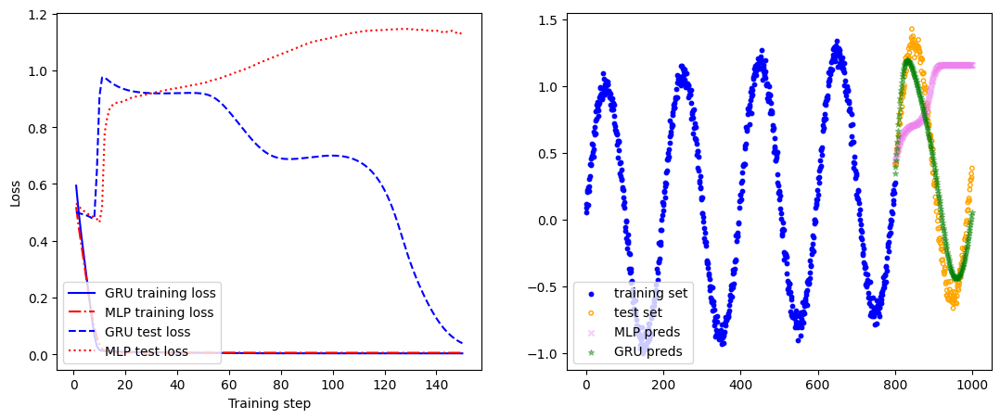

In [56]:
# 最终测试结果
gru_preds = test_gru(gru, x_test[0], hidden[:, -1], len(y_test)).numpy()
mlp_preds = test_mlp(mlp, x_test[0], len(y_test)).numpy()

plt.figure(figsize=(13, 5))

# 绘制训练曲线
plt.subplot(121)
x_plot = np.arange(len(gru_losses)) + 1
plt.plot(x_plot, gru_losses, color='blue', 
    label='GRU training loss')
plt.plot(x_plot, mlp_losses, color='red', 
    ls='-.', label='MLP training loss')
plt.plot(x_plot, gru_test_losses, color='blue', 
    ls='--', label='GRU test loss')
plt.plot(x_plot, mlp_test_losses, color='red', 
    ls=':', label='MLP test loss')
plt.xlabel('Training step')
plt.ylabel('Loss')
plt.legend(loc='lower left')

# 绘制真实数据与模型预测值的图像
plt.subplot(122)
plt.scatter(np.arange(split), data[:split], color='blue', 
    s=10, label='training set')
plt.scatter(np.arange(split, num_data), data[split:], color='none', 
    edgecolor='orange', s=10, label='test set')
plt.scatter(np.arange(split, num_data - 1), mlp_preds, color='violet', 
    marker='x', alpha=0.4, s=20, label='MLP preds')
plt.scatter(np.arange(split, num_data - 1), gru_preds, color='green', 
    marker='*', alpha=0.4, s=20, label='GRU preds')
plt.legend(loc='lower left')
plt.savefig('output_20_0.png')
plt.savefig('output_20_0.pdf')
plt.show()

# 11 支持向量机

数据集大小： 200


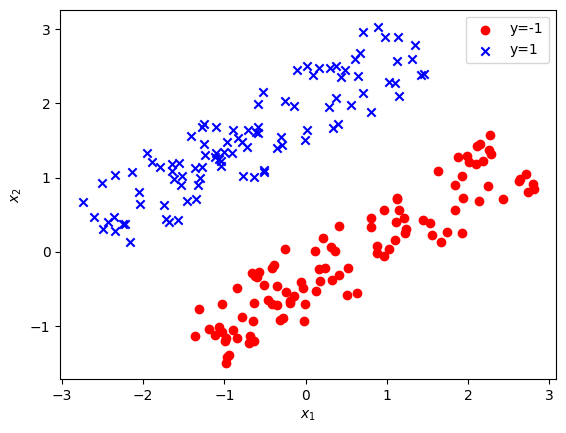

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from tqdm import tqdm, trange

data = np.loadtxt('/kaggle/input/linear-and-spiral/linear.csv', delimiter=',')
print('数据集大小：', len(data))
x = data[:, :2]
y = data[:, 2]

# 数据集可视化
plt.figure()
plt.scatter(x[y == -1, 0], x[y == -1, 1], color='red', label='y=-1')
plt.scatter(x[y == 1, 0], x[y == 1, 1], color='blue', marker='x', label='y=1')
plt.xlabel(r'$x_1$')
plt.ylabel(r'$x_2$')
plt.legend()
plt.show()

In [58]:
def SMO(x, y, ker, C, max_iter):
    '''
    SMO算法
    x，y：样本的值和类别
    ker：核函数，与线性回归中核函数的含义相同
    C：惩罚系数
    max_iter：最大迭代次数
    '''
    # 初始化参数
    m = x.shape[0]
    alpha = np.zeros(m)
        
    # 预先计算所有向量的两两内积，减少重复计算
    K = np.zeros((m, m))
    for i in range(m):
        for j in range(m):
            K[i, j] = ker(x[i], x[j])
    
    for l in trange(max_iter):
        # 开始迭代
        for i in range(m):
            # 有m个参数，每一轮迭代中依次更新
            # 固定参数alpha_i与另一个随机参数alpha_j，并且保证i与j不相等
            j = np.random.choice([l for l in range(m) if l != i])
            
            # 用-b/2a更新alpha_i的值
            eta = K[j, j] + K[i, i] - 2 * K[i, j] # 分母
            e_i = np.sum(y * alpha * K[:, i]) - y[i] # 分子
            e_j = np.sum(y * alpha * K[:, j]) - y[j]
            alpha_i = alpha[i] + y[i] * (e_j - e_i) / (eta + 1e-5) # 防止除以0
            zeta = alpha[i] * y[i] + alpha[j] * y[j]

            # 将alpha_i和对应的alpha_j保持在[0,C]区间
            # 0 <= (zeta - y_j * alpha_j) / y_i <= C
            if y[i] == y[j]:
                lower = max(0, zeta / y[i] - C)
                upper = min(C, zeta / y[i])
            else:
                lower = max(0, zeta / y[i])
                upper = min(C, zeta / y[i] + C)
            alpha_i = np.clip(alpha_i, lower, upper)
            alpha_j = (zeta - y[i] * alpha_i) / y[j]
            
            # 更新参数
            alpha[i], alpha[j] = alpha_i, alpha_j

    return alpha

In [59]:
# 设置超参数
C = 1e8 # 由于数据集完全线性可分，我们不引入松弛变量
max_iter = 1000
np.random.seed(0)

alpha = SMO(x, y, ker=np.inner, C=C, max_iter=max_iter)

100%|██████████| 1000/1000 [00:21<00:00, 46.93it/s]


支持向量个数： 6
参数： [-1.0211867   1.66445549] -1.3127020970395464


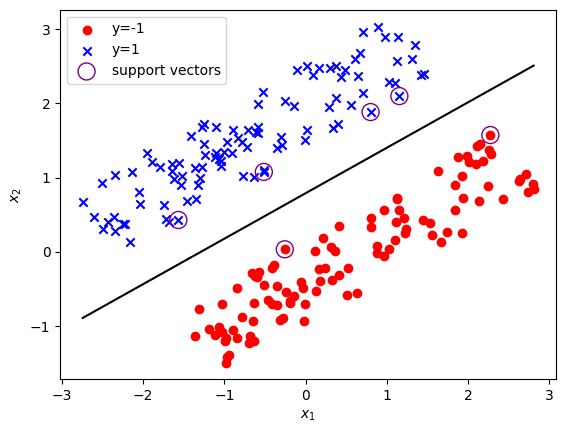

In [60]:
# 用alpha计算w，b和支持向量
sup_idx = alpha > 1e-5 # 支持向量的系数不为零
print('支持向量个数：', np.sum(sup_idx))
w = np.sum((alpha[sup_idx] * y[sup_idx]).reshape(-1, 1) * x[sup_idx], axis=0)
wx = x @ w.reshape(-1, 1)
b = -0.5 * (np.max(wx[y == -1]) + np.min(wx[y == 1]))
print('参数：', w, b)

# 绘图
X = np.linspace(np.min(x[:, 0]), np.max(x[:, 0]), 100)
Y = -(w[0] * X + b) / (w[1] + 1e-5)
plt.figure()
plt.scatter(x[y == -1, 0], x[y == -1, 1], color='red', label='y=-1')
plt.scatter(x[y == 1, 0], x[y == 1, 1], marker='x', color='blue', label='y=1')
plt.plot(X, Y, color='black')
# 用圆圈标记出支持向量
plt.scatter(x[sup_idx, 0], x[sup_idx, 1], marker='o', color='none', 
    edgecolor='purple', s=150, label='support vectors')
plt.xlabel(r'$x_1$')
plt.ylabel(r'$x_2$')
plt.legend()
plt.show()

数据集大小： 194


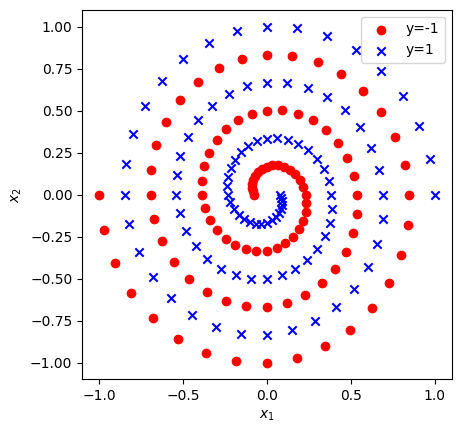

In [61]:
data = np.loadtxt('/kaggle/input/linear-and-spiral/spiral.csv', delimiter=',')
print('数据集大小：', len(data))
x = data[:, :2]
y = data[:, 2]

# 数据集可视化
plt.figure()
plt.scatter(x[y == -1, 0], x[y == -1, 1], color='red', label='y=-1')
plt.scatter(x[y == 1, 0], x[y == 1, 1], marker='x', color='blue', label='y=1')
plt.xlabel(r'$x_1$')
plt.ylabel(r'$x_2$')
plt.legend()
plt.axis('square')
plt.show()

In [62]:
# 简单多项式核
def simple_poly_kernel(d):
    def k(x, y): 
        return np.inner(x, y) ** d
    return k

# RBF核
def rbf_kernel(sigma):
    def k(x, y):
        return np.exp(-np.inner(x - y, x - y) / (2.0 * sigma ** 2))
    return k

# 余弦相似度核
def cos_kernel(x, y):
    return np.inner(x, y) / np.linalg.norm(x, 2) / np.linalg.norm(y, 2)

# sigmoid核
def sigmoid_kernel(beta, c):
    def k(x, y):
        return np.tanh(beta * np.inner(x, y) + c)
    return k

核函数： Poly(3)


100%|██████████| 500/500 [00:10<00:00, 48.94it/s]


核函数： RBF(0.1)


100%|██████████| 500/500 [00:10<00:00, 49.27it/s]


核函数： Cos


100%|██████████| 500/500 [00:09<00:00, 50.78it/s]


核函数： Sigmoid(1,-1)


100%|██████████| 500/500 [00:10<00:00, 48.67it/s]


<Figure size 640x480 with 0 Axes>

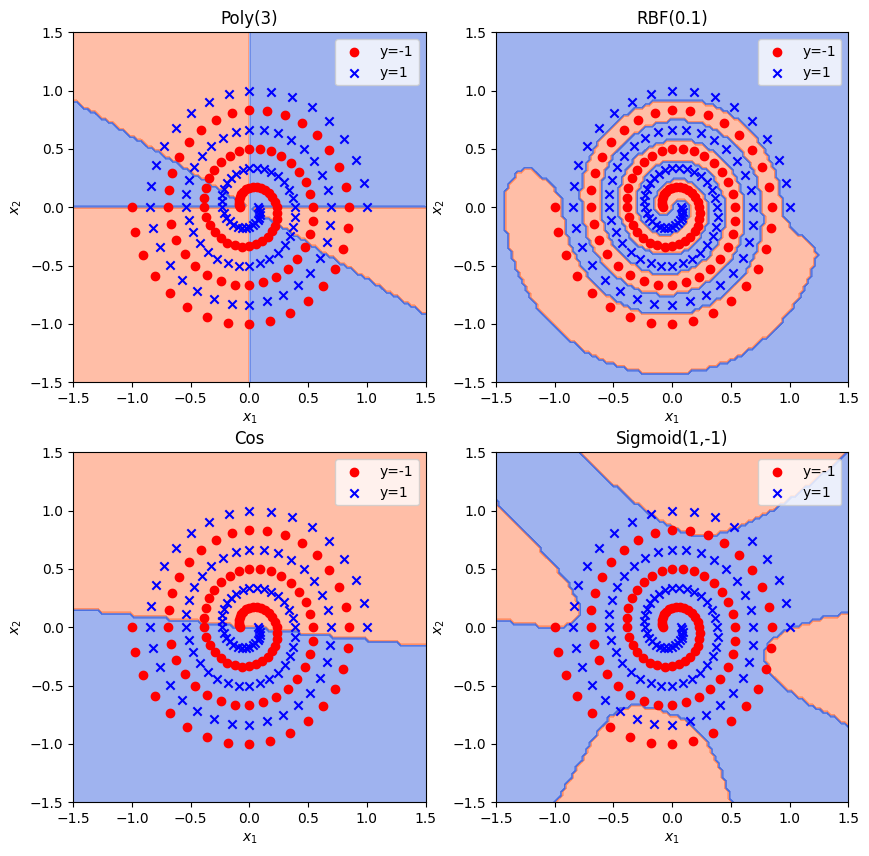

In [63]:
kernels = [
    simple_poly_kernel(3), 
    rbf_kernel(0.1), 
    cos_kernel, 
    sigmoid_kernel(1, -1)
]
ker_names = ['Poly(3)', 'RBF(0.1)', 'Cos', 'Sigmoid(1,-1)']
C = 1e8
max_iter = 500

# 绘图准备，构造网格
plt.figure()
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs = axs.flatten()
cmap = ListedColormap(['coral', 'royalblue'])

# 开始求解 SVM
for i in range(len(kernels)):
    print('核函数：', ker_names[i])
    alpha = SMO(x, y, kernels[i], C=C, max_iter=max_iter)
    sup_idx = alpha > 1e-5 # 支持向量的系数不为零
    sup_x = x[sup_idx] # 支持向量
    sup_y = y[sup_idx]
    sup_alpha = alpha[sup_idx]

    # 用支持向量计算 w^T*x
    def wx(x_new):
        s = 0
        for xi, yi, ai in zip(sup_x, sup_y, sup_alpha):
            s += yi * ai * kernels[i](xi, x_new)
        return s

    # 计算b*
    neg = [wx(xi) for xi in sup_x[sup_y == -1]]
    pos = [wx(xi) for xi in sup_x[sup_y == 1]]
    b = -0.5 * (np.max(neg) + np.min(pos))

    # 构造网格并用 SVM 预测分类
    G = np.linspace(-1.5, 1.5, 100)
    G = np.meshgrid(G, G)
    X = np.array([G[0].flatten(), G[1].flatten()]).T # 转换为每行一个向量的形式
    Y = np.array([wx(xi) + b for xi in X])
    Y[Y < 0] = -1
    Y[Y >= 0] = 1
    Y = Y.reshape(G[0].shape)
    axs[i].contourf(G[0], G[1], Y, cmap=cmap, alpha=0.5)
    # 绘制原数据集的点
    axs[i].scatter(x[y == -1, 0], x[y == -1, 1], color='red', label='y=-1')
    axs[i].scatter(x[y == 1, 0], x[y == 1, 1], marker='x', color='blue', label='y=1')
    axs[i].set_title(ker_names[i])
    axs[i].set_xlabel(r'$x_1$')
    axs[i].set_ylabel(r'$x_2$')
    axs[i].legend()

plt.show()

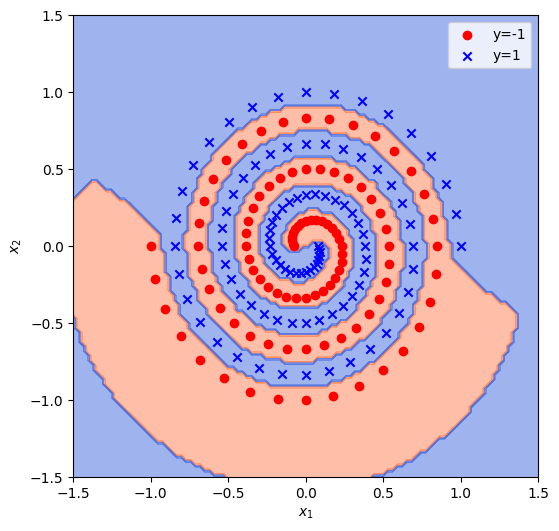

In [64]:
# 从sklearn.svm中导入SVM分类器
from sklearn.svm import SVC

# 定义SVM模型，包括定义使用的核函数与参数信息
model = SVC(kernel='rbf', gamma=50, tol=1e-6)
model.fit(x, y)

# 绘制结果
fig = plt.figure(figsize=(6,6))
G = np.linspace(-1.5, 1.5, 100)
G = np.meshgrid(G, G)
X = np.array([G[0].flatten(), G[1].flatten()]).T # 转换为每行一个向量的形式
Y = model.predict(X)
Y = Y.reshape(G[0].shape)
plt.contourf(G[0], G[1], Y, cmap=cmap, alpha=0.5)
# 绘制原数据集的点
plt.scatter(x[y == -1, 0], x[y == -1, 1], color='red', label='y=-1')
plt.scatter(x[y == 1, 0], x[y == 1, 1], marker='x', color='blue', label='y=1')
plt.xlabel(r'$x_1$')
plt.ylabel(r'$x_2$')
plt.legend()
plt.show()

# 12 决策树

In [65]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# 读取数据
data = pd.read_csv('/kaggle/input/titanic/train.csv')
# 查看数据集信息和前5行具体内容，其中NaN代表数据缺失
print(data.info())
print(data[:5])

# 删去编号、姓名、船票编号3列
data.drop(columns=['PassengerId', 'Name', 'Ticket'], inplace=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB
None
   PassengerId  Survived  Pclass  \
0            1         0       3   
1            2         1       1   
2            3         1       3   
3            4         1       1   
4            5         0       3   

                      

In [66]:
feat_ranges = {}
cont_feat = ['Age', 'Fare'] # 连续特征
bins = 10 # 分类点数

for feat in cont_feat:
    # 数据集中存在缺省值nan，需要用np.nanmin和np.nanmax
    min_val = np.nanmin(data[feat]) 
    max_val = np.nanmax(data[feat])
    feat_ranges[feat] = np.linspace(min_val, max_val, bins).tolist()
    print(feat, '：') # 查看分类点
    for spt in feat_ranges[feat]:
        print(f'{spt:.4f}')

Age ：
0.4200
9.2622
18.1044
26.9467
35.7889
44.6311
53.4733
62.3156
71.1578
80.0000
Fare ：
0.0000
56.9255
113.8509
170.7764
227.7019
284.6273
341.5528
398.4783
455.4037
512.3292


In [67]:
# 只有有限取值的离散特征
cat_feat = ['Sex', 'Pclass', 'SibSp', 'Parch', 'Cabin', 'Embarked'] 
for feat in cat_feat:
    data[feat] = data[feat].astype('category') # 数据格式转为分类格式
    print(f'{feat}：{data[feat].cat.categories}') # 查看类别
    data[feat] = data[feat].cat.codes.to_list() # 将类别按顺序转换为整数
    ranges = list(set(data[feat]))
    ranges.sort()
    feat_ranges[feat] = ranges

Sex：Index(['female', 'male'], dtype='object')
Pclass：Index([1, 2, 3], dtype='int64')
SibSp：Index([0, 1, 2, 3, 4, 5, 8], dtype='int64')
Parch：Index([0, 1, 2, 3, 4, 5, 6], dtype='int64')
Cabin：Index(['A10', 'A14', 'A16', 'A19', 'A20', 'A23', 'A24', 'A26', 'A31', 'A32',
       ...
       'E8', 'F E69', 'F G63', 'F G73', 'F2', 'F33', 'F38', 'F4', 'G6', 'T'],
      dtype='object', length=147)
Embarked：Index(['C', 'Q', 'S'], dtype='object')


In [68]:
# 将所有缺省值替换为-1
data.fillna(-1, inplace=True)
for feat in feat_ranges.keys():
    feat_ranges[feat] = [-1] + feat_ranges[feat]

In [69]:
# 划分训练集与测试集
np.random.seed(0)
feat_names = data.columns[1:]
label_name = data.columns[0]
# 重排下标之后，按新的下标索引数据
data = data.reindex(np.random.permutation(data.index))
ratio = 0.8
split = int(ratio * len(data))
train_x = data[:split].drop(columns=['Survived']).to_numpy()
train_y = data['Survived'][:split].to_numpy()
test_x = data[split:].drop(columns=['Survived']).to_numpy()
test_y = data['Survived'][split:].to_numpy()
print('训练集大小：', len(train_x))
print('测试集大小：', len(test_x))
print('特征数：', train_x.shape[1])

训练集大小： 712
测试集大小： 179
特征数： 8


In [70]:
class Node:

    def __init__(self):
        # 内部结点的feat表示用来分类的特征编号，其数字与数据中的顺序对应
        # 叶结点的feat表示该结点对应的分类结果
        self.feat = None
        # 分类值列表，表示按照其中的值向子结点分类
        self.split = None
        # 子结点列表，叶结点的child为空
        self.child = []

In [71]:
class DecisionTree:

    def __init__(self, X, Y, feat_ranges, lbd):
        self.root = Node()
        self.X = X
        self.Y = Y
        self.feat_ranges = feat_ranges # 特征取值范围
        self.lbd = lbd # 正则化系数
        self.eps = 1e-8 # 防止数学错误log(0)和除以0
        self.T = 0 # 记录叶结点个数
        self.ID3(self.root, self.X, self.Y)

    # 工具函数，计算 a * log a
    def aloga(self, a):
        return a * np.log2(a + self.eps)

    # 计算某个子数据集的熵
    def entropy(self, Y):
        cnt = np.unique(Y, return_counts=True)[1] # 统计每个类别出现的次数
        N = len(Y)
        ent = -np.sum([self.aloga(Ni / N) for Ni in cnt])
        return ent

    # 计算用feat <= val划分数据集的信息增益
    def info_gain(self, X, Y, feat, val):
        # 划分前的熵
        N = len(Y)
        if N == 0:
            return 0
        HX = self.entropy(Y)
        HXY = 0 # H(X|Y)
        # 分别计算H(X|X_F<=val)和H(X|X_F>val)
        Y_l = Y[X[:, feat] <= val]
        HXY += len(Y_l) / len(Y) * self.entropy(Y_l)
        Y_r = Y[X[:, feat] > val]
        HXY += len(Y_r) / len(Y) * self.entropy(Y_r)
        return HX - HXY

    # 计算特征feat <= val本身的复杂度H_Y(X)
    def entropy_YX(self, X, Y, feat, val):
        HYX = 0
        N = len(Y)
        if N == 0:
            return 0
        Y_l = Y[X[:, feat] <= val]
        HYX += -self.aloga(len(Y_l) / N)
        Y_r = Y[X[:, feat] > val]
        HYX += -self.aloga(len(Y_r) / N)
        return HYX

    # 计算用feat <= val划分数据集的信息增益率
    def info_gain_ratio(self, X, Y, feat, val):
        IG = self.info_gain(X, Y, feat, val)
        HYX = self.entropy_YX(X, Y, feat, val)
        return IG / HYX

    # 用ID3算法递归分裂结点，构造决策树
    def ID3(self, node, X, Y):
        # 判断是否已经分类完成
        if len(np.unique(Y)) == 1:
            node.feat = Y[0]
            self.T += 1
            return
        
        # 寻找最优分类特征和分类点
        best_IGR = 0
        best_feat = None
        best_val = None
        for feat in range(len(feat_names)):
            for val in self.feat_ranges[feat_names[feat]]:
                IGR = self.info_gain_ratio(X, Y, feat, val)
                if IGR > best_IGR:
                    best_IGR = IGR
                    best_feat = feat
                    best_val = val
        
        # 计算用best_feat <= best_val分类带来的代价函数变化
        # 由于分裂叶结点只涉及该局部，我们只需要计算分裂前后该结点的代价函数
        # 当前代价
        cur_cost = len(Y) * self.entropy(Y) + self.lbd
        # 分裂后的代价，按best_feat的取值分类统计
        # 如果best_feat为None，说明最优的信息增益率为0，
        # 再分类也无法增加信息了，因此将new_cost设置为无穷大
        if best_feat is None:
            new_cost = np.inf
        else:
            new_cost = 0
            X_feat = X[:, best_feat]
            # 获取划分后的两部分，计算新的熵
            new_Y_l = Y[X_feat <= best_val]
            new_cost += len(new_Y_l) * self.entropy(new_Y_l)
            new_Y_r = Y[X_feat > best_val]
            new_cost += len(new_Y_r) * self.entropy(new_Y_r)
            # 分裂后会有两个叶结点
            new_cost += 2 * self.lbd

        if new_cost <= cur_cost:
            # 如果分裂后代价更小，那么执行分裂
            node.feat = best_feat
            node.split = best_val
            l_child = Node()
            l_X = X[X_feat <= best_val]
            l_Y = Y[X_feat <= best_val]
            self.ID3(l_child, l_X, l_Y)
            r_child = Node()
            r_X = X[X_feat > best_val]
            r_Y = Y[X_feat > best_val]
            self.ID3(r_child, r_X, r_Y)
            node.child = [l_child, r_child]
        else:
            # 否则将当前结点上最多的类别作为该结点的类别
            vals, cnt = np.unique(Y, return_counts=True)
            node.feat = vals[np.argmax(cnt)]
            self.T += 1

    # 预测新样本的分类
    def predict(self, x):
        node = self.root
        # 从根结点开始向下寻找，到叶结点结束
        while node.split is not None:
            # 判断x应该处于哪个子结点
            if x[node.feat] <= node.split:
                node = node.child[0]
            else:
                node = node.child[1]
        # 到达叶结点，返回类别
        return node.feat

    # 计算在样本X，标签Y上的准确率
    def accuracy(self, X, Y):
        correct = 0
        for x, y in zip(X, Y):
            pred = self.predict(x)
            if pred == y:
                correct += 1
        return correct / len(Y)

In [72]:
DT = DecisionTree(train_x, train_y, feat_ranges, lbd=1.0)
print('叶结点数量：', DT.T)

# 计算在训练集和测试集上的准确率
print('训练集准确率：', DT.accuracy(train_x, train_y))
print('测试集准确率：', DT.accuracy(test_x, test_y))

叶结点数量： 23
训练集准确率： 0.8300561797752809
测试集准确率： 0.7262569832402235


In [73]:
from sklearn import tree

# criterion表示分类依据，max_depth表示树的最大深度
# entropy生成的是C4.5分类树
c45 = tree.DecisionTreeClassifier(criterion='entropy', max_depth=6)
c45.fit(train_x, train_y)
# gini生成的是CART分类树
cart = tree.DecisionTreeClassifier(criterion='gini', max_depth=6)
cart.fit(train_x, train_y)

c45_train_pred = c45.predict(train_x)
c45_test_pred = c45.predict(test_x)
cart_train_pred = cart.predict(train_x)
cart_test_pred = cart.predict(test_x)
print(f'训练集准确率：C4.5：{np.mean(c45_train_pred == train_y)}，' \
    f'CART：{np.mean(cart_train_pred == train_y)}')
print(f'测试集准确率：C4.5：{np.mean(c45_test_pred == test_y)}，' \
    f'CART：{np.mean(cart_test_pred == test_y)}')

训练集准确率：C4.5：0.8792134831460674，CART：0.8848314606741573
测试集准确率：C4.5：0.7150837988826816，CART：0.7877094972067039


In [74]:
!pip install pydotplus

from six import StringIO
import pydotplus

dot_data = StringIO()
tree.export_graphviz( # 导出sklearn的决策树的可视化数据
    c45,
    out_file=dot_data,
    feature_names=feat_names,
    class_names=['non-survival', 'survival'],
    filled=True, 
    rounded=True,
    impurity=False
)
# 用pydotplus生成图像
graph = pydotplus.graph_from_dot_data(
    dot_data.getvalue().replace('\n', '')) 
graph.write_png('tree.png')
plt.show()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.7/278.7 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - done
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24552 sha256=98083e9e449bc1965e47ba99d802021c2508281dac410243513edb56041b3312
  Stored in directory: /root/.cache/pip/wheels/69/b2/67/08f0eef649af92df772c09f451558298e07fab1bc7cdf33db0
Successfully built pydotplus


出不来啊咋回事

![](http://)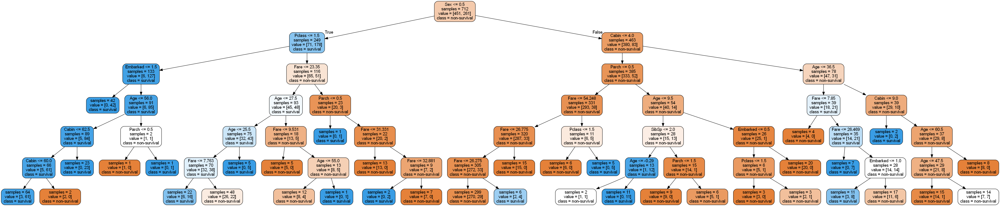

# 13 集成学习与梯度提升决策树

In [75]:
from tqdm import tqdm
import numpy as np
from matplotlib import pyplot as plt
from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier as DTC
from sklearn.model_selection import train_test_split

# 创建随机数据集
X, y = make_classification(
    n_samples=1000, # 数据集大小
    n_features=16, # 特征数，即数据维度
    n_informative=5, # 有效特征个数
    n_redundant=2, # 冗余特征个数，为有效特征的随机线性组合
    n_classes=2, # 类别数
    flip_y=0.1, # 类别随机的样本个数，该值越大，分类越困难
    random_state=0 # 随机种子
)

print(X.shape)

(1000, 16)


In [76]:
class RandomForest():

    def __init__(self, n_trees=10, max_features='sqrt'):
        # max_features是DTC的参数，表示结点分裂时随机采样的特征个数
        # sqrt代表取全部特征的平方根，None代表取全部特征，log2代表取全部特征的对数
        self.n_trees = n_trees
        self.oob_score = 0
        self.trees = [DTC(max_features=max_features)
            for _ in range(n_trees)]

    # 用X和y训练模型
    def fit(self, X, y):
        n_samples, n_features = X.shape
        self.n_classes = np.unique(y).shape[0]   
        # 集成模型的预测，累加单个模型预测的分类概率，再取较大值作为最终分类
        ensemble = np.zeros((n_samples, self.n_classes))
            
        for tree in self.trees:
            # 自举采样，该采样允许重复
            idx = np.random.randint(0, n_samples, n_samples)
            # 没有被采到的样本
            unsampled_mask = np.bincount(idx, minlength=n_samples) == 0
            unsampled_idx = np.arange(n_samples)[unsampled_mask]
            # 训练当前决策树
            tree.fit(X[idx], y[idx])
            # 累加决策树对OOB样本的预测
            ensemble[unsampled_idx] += tree.predict_proba(X[unsampled_idx])
        # 计算OOB分数，由于是分类任务，我们用正确率来衡量
        self.oob_score = np.mean(y == np.argmax(ensemble, axis=1))
    
    # 预测类别
    def predict(self, X):
        proba = self.predict_proba(X)
        return np.argmax(proba, axis=1)
    
    def predict_proba(self, X):
        # 取所有决策树预测概率的平均
        ensemble = np.mean([tree.predict_proba(X)
            for tree in self.trees], axis=0)
        return ensemble
    
    # 计算正确率
    def score(self, X, y):
        return np.mean(y == self.predict(X))

100%|██████████| 20/20 [00:04<00:00,  4.61it/s, n_tree=96, train_score=1, oob_score=0.897]


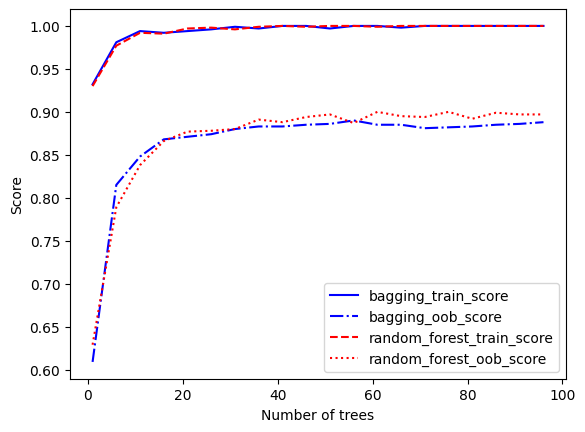

In [77]:
# 算法测试与可视化
num_trees = np.arange(1, 101, 5)
np.random.seed(0)
plt.figure()

# bagging算法
oob_score = []
train_score = []
with tqdm(num_trees) as pbar:
    for n_tree in pbar:
        rf = RandomForest(n_trees=n_tree, max_features=None)
        rf.fit(X, y)
        train_score.append(rf.score(X, y))
        oob_score.append(rf.oob_score)
        pbar.set_postfix({
            'n_tree': n_tree, 
            'train_score': train_score[-1], 
            'oob_score': oob_score[-1]
        })
plt.plot(num_trees, train_score, color='blue', 
    label='bagging_train_score')
plt.plot(num_trees, oob_score, color='blue', linestyle='-.', 
    label='bagging_oob_score')

# 随机森林算法
oob_score = []
train_score = []
with tqdm(num_trees) as pbar:
    for n_tree in pbar:
        rf = RandomForest(n_trees=n_tree, max_features='sqrt')
        rf.fit(X, y)
        train_score.append(rf.score(X, y))
        oob_score.append(rf.oob_score)
        pbar.set_postfix({
            'n_tree': n_tree, 
            'train_score': train_score[-1], 
            'oob_score': oob_score[-1]
        })
plt.plot(num_trees, train_score, color='red', linestyle='--', 
    label='random_forest_train_score')
plt.plot(num_trees, oob_score, color='red', linestyle=':', 
    label='random_forest_oob_score')

plt.ylabel('Score')
plt.xlabel('Number of trees')
plt.legend()
plt.show()

In [78]:
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

bc = BaggingClassifier(n_estimators=100, oob_score=True, random_state=0)
bc.fit(X, y)
print('bagging：', bc.oob_score_)

rfc = RandomForestClassifier(n_estimators=100, max_features='sqrt', 
    oob_score=True, random_state=0)
rfc.fit(X, y)
print('随机森林：', rfc.oob_score_)

bagging： 0.885
随机森林： 0.897


In [79]:
from sklearn.model_selection import KFold
from sklearn.base import clone

# 堆垛分类器，继承sklearn中的集成分类器基类EnsembleClassifier
class StackingClassifier():

    def __init__(
        self, 
        classifiers, # 基础分类器
        meta_classifier, # 元分类器
        concat_feature=False, # 是否将原始数据拼接在新数据上
        kfold=5 # K折交叉验证
    ):
        self.classifiers = classifiers
        self.meta_classifier = meta_classifier
        self.concat_feature = concat_feature
        self.kf = KFold(n_splits=kfold)
        # 为了在测试时计算平均，我们需要保留每个分类器
        self.k_fold_classifiers = []
        
    def fit(self, X, y):
        # 用X和y训练基础分类器和元分类器
        n_samples, n_features = X.shape
        self.n_classes = np.unique(y).shape[0]
        
        if self.concat_feature:
            features = X
        else:
            features = np.zeros((n_samples, 0))
        for classifier in self.classifiers:
            self.k_fold_classifiers.append([])
            # 训练每个基础分类器
            predict_proba = np.zeros((n_samples, self.n_classes))
            for train_idx, test_idx in self.kf.split(X):
                # 交叉验证
                clf = clone(classifier)
                clf.fit(X[train_idx], y[train_idx])
                predict_proba[test_idx] = clf.predict_proba(X[test_idx])
                self.k_fold_classifiers[-1].append(clf)
            features = np.concatenate([features, predict_proba], axis=-1)
        # 训练元分类器
        self.meta_classifier.fit(features, y)
    
    def _get_features(self, X):
        # 计算输入X的特征
        if self.concat_feature:
            features = X
        else:
            features = np.zeros((X.shape[0], 0))
        for k_classifiers in self.k_fold_classifiers:
            k_feat = np.mean([clf.predict_proba(X)
                for clf in k_classifiers], axis=0)
            features = np.concatenate([features, k_feat], axis=-1)
        return features
    
    def predict(self, X):
        return self.meta_classifier.predict(self._get_features(X))
        
    def score(self, X, y):
        return self.meta_classifier.score(self._get_features(X), y)

In [80]:
from sklearn.linear_model import LogisticRegression as LR
from sklearn.ensemble import RandomForestClassifier as RFC
from sklearn.neighbors import KNeighborsClassifier as KNC

# 划分训练集和测试集
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=0.2, random_state=0)

# 基础分类器
rf = RFC(n_estimators=10, max_features='sqrt', 
    random_state=0).fit(X_train, y_train)
knc = KNC().fit(X_train, y_train)
# multi_class='ovr'表示二分类问题
lr = LR(solver='liblinear', multi_class='ovr', 
    random_state=0).fit(X_train, y_train)
print('随机森林：', rf.score(X_test, y_test))
print('KNN：', knc.score(X_test, y_test))
print('逻辑斯谛回归：', lr.score(X_test, y_test))
# 元分类器
meta_lr = LR(solver='liblinear', multi_class='ovr', random_state=0)

sc = StackingClassifier([rf, knc, lr], meta_lr, concat_feature=False)
sc.fit(X_train, y_train)
print('Stacking分类器：', sc.score(X_test, y_test))

# 带原始特征的stacking分类器
sc_concat = StackingClassifier([rf, knc, lr], meta_lr, concat_feature=True)
sc_concat.fit(X_train, y_train)
print('带原始特征的Stacking分类器：', sc_concat.score(X_test, y_test))

随机森林： 0.895
KNN： 0.9
逻辑斯谛回归： 0.855
Stacking分类器： 0.91
带原始特征的Stacking分类器： 0.905


100%|██████████| 20/20 [00:13<00:00,  1.47it/s]


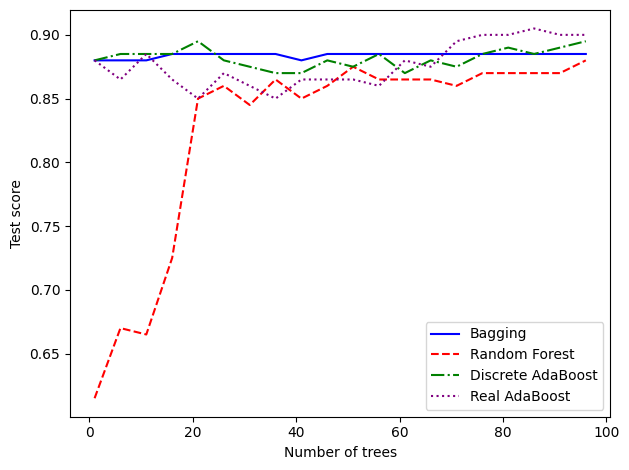

In [81]:
from sklearn.ensemble import AdaBoostClassifier

# 初始化stump
stump = DTC(max_depth=1, min_samples_leaf=1, random_state=0)

# 弱分类器个数
M = np.arange(1, 101, 5)
bg_score = []
rf_score = []
dsc_ada_score = []
real_ada_score = []
plt.figure()

with tqdm(M) as pbar:
    for m in pbar:
        # bagging算法
        bc = BaggingClassifier(estimator=stump, 
            n_estimators=m, random_state=0)
        bc.fit(X_train, y_train)
        bg_score.append(bc.score(X_test, y_test))
        # 随机森林算法
        rfc = RandomForestClassifier(n_estimators=m, max_depth=1, 
            min_samples_leaf=1, random_state=0)
        rfc.fit(X_train, y_train)
        rf_score.append(rfc.score(X_test, y_test))
        # 离散 AdaBoost，SAMME是分步加性模型（stepwise additive model）的缩写
        dsc_adaboost = AdaBoostClassifier(estimator=stump, 
            n_estimators=m, algorithm='SAMME', random_state=0)
        dsc_adaboost.fit(X_train, y_train)
        dsc_ada_score.append(dsc_adaboost.score(X_test, y_test))
        # 实 AdaBoost，SAMME.R表示弱分类器输出实数
        real_adaboost = AdaBoostClassifier(estimator=stump, 
            n_estimators=m, algorithm='SAMME.R', random_state=0)
        real_adaboost.fit(X_train, y_train)
        real_ada_score.append(real_adaboost.score(X_test, y_test))

# 绘图
plt.plot(M, bg_score, color='blue', label='Bagging')
plt.plot(M, rf_score, color='red', ls='--', label='Random Forest')
plt.plot(M, dsc_ada_score, color='green', ls='-.', label='Discrete AdaBoost')
plt.plot(M, real_ada_score, color='purple', ls=':', label='Real AdaBoost')
plt.xlabel('Number of trees')
plt.ylabel('Test score')
plt.legend()
plt.tight_layout()
plt.savefig('output_26_1.png')
plt.savefig('output_26_1.pdf')
plt.show()

In [82]:
# 安装并导入xgboost库
!pip install xgboost
import xgboost as xgb
from sklearn.datasets import make_friedman1
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor, \
    StackingRegressor, AdaBoostRegressor

# 生成回归数据集
reg_X, reg_y = make_friedman1(
    n_samples=2000, # 样本数目
    n_features=100, # 特征数目
    noise=0.5, # 噪声的标准差
    random_state=0 # 随机种子
)

# 划分训练集与测试集
reg_X_train, reg_X_test, reg_y_train, reg_y_test = \
    train_test_split(reg_X, reg_y, test_size=0.2, random_state=0)

In [83]:
def rmse(regressor):
    # 计算regressor在测试集上的RMSE
    y_pred = regressor.predict(reg_X_test)
    return np.sqrt(np.mean((y_pred - reg_y_test) ** 2))

# XGBoost回归树
xgbr = xgb.XGBRegressor(
    n_estimators=100, # 弱分类器数目
    max_depth=1, # 决策树最大深度
    learning_rate=0.5, # 学习率
    gamma=0.0, # 对决策树叶结点数目的惩罚系数，当弱分类器为stump时不起作用
    reg_lambda=0.1, # L2正则化系数
    subsample=0.5, # 与随机森林类似，表示采样特征的比例
    objective='reg:squarederror', # MSE损失函数
    eval_metric='rmse', # 用RMSE作为评价指标
    random_state=0 # 随机种子
)

xgbr.fit(reg_X_train, reg_y_train)
print(f'XGBoost：{rmse(xgbr):.3f}')

# KNN回归
knnr = KNeighborsRegressor(n_neighbors=5).fit(reg_X_train, reg_y_train)
print(f'KNN：{rmse(knnr):.3f}')

# 线性回归
lnr = LinearRegression().fit(reg_X_train, reg_y_train)
print(f'线性回归：{rmse(lnr):.3f}')

# bagging
stump_reg = DecisionTreeRegressor(max_depth=1, 
    min_samples_leaf=1, random_state=0)
bcr = BaggingRegressor(estimator=stump_reg, 
    n_estimators=100, random_state=0)
bcr.fit(reg_X_train, reg_y_train)
print(f'Bagging：{rmse(bcr):.3f}')

# 随机森林
rfr = RandomForestRegressor(n_estimators=100, max_depth=1, 
    max_features='sqrt', random_state=0)
rfr.fit(reg_X_train, reg_y_train)
print(f'随机森林：{rmse(rfr):.3f}')

# 堆垛，默认元学习器为带L2正则化约束的线性回归
stkr = StackingRegressor(estimators=[
    ('knn', knnr), 
    ('ln', lnr), 
    ('rf', rfr)
])
stkr.fit(reg_X_train, reg_y_train)
print(f'Stacking：{rmse(stkr):.3f}')

# 带有输入特征的堆垛
stkr_pt = StackingRegressor(estimators=[
    ('knn', knnr), 
    ('ln', lnr), 
    ('rf', rfr)
], passthrough=True)
stkr_pt.fit(reg_X_train, reg_y_train)
print(f'带输入特征的Stacking：{rmse(stkr_pt):.3f}')

# AdaBoost，回归型AdaBoost只有连续型，没有离散型
abr = AdaBoostRegressor(estimator=stump_reg, n_estimators=100, 
    learning_rate=1.5, loss='square', random_state=0)
abr.fit(reg_X_train, reg_y_train)
print(f'AdaBoost：{rmse(abr):.3f}')

XGBoost：1.683
KNN：4.471
线性回归：2.525
Bagging：4.042
随机森林：4.514
Stacking：2.231
带输入特征的Stacking：2.288
AdaBoost：3.116


#  14 k均值聚类

In [84]:
import numpy as np
import matplotlib.pyplot as plt

dataset = np.loadtxt('/kaggle/input/kmeans-data1/kmeans_data.csv', delimiter=',')
print('数据集大小：', len(dataset))

数据集大小： 80


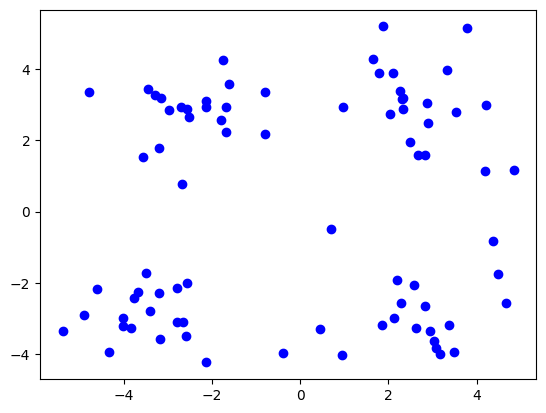

In [85]:
# 绘图函数
def show_cluster(dataset, cluster, centroids=None):  
    # dataset：数据
    # centroids：聚类中心点的坐标
    # cluster：每个样本所属聚类
    # 不同种类的颜色，用以区分划分的数据的类别
    colors = ['blue', 'red', 'green', 'purple']
    markers = ['o', '^', 's', 'd']
    # 画出所有样例
    K = len(np.unique(cluster))
    for i in range(K):
        plt.scatter(dataset[cluster == i, 0], dataset[cluster == i, 1], 
            color=colors[i], marker=markers[i])

    # 画出中心点
    if centroids is not None:
        plt.scatter(centroids[:, 0], centroids[:, 1], 
            color=colors[:K], marker='+', s=150)  
        
    plt.show()

# 初始时不区分类别
show_cluster(dataset, np.zeros(len(dataset), dtype=int))

In [86]:
def random_init(dataset, K):
    # 随机选取是不重复的
    idx = np.random.choice(np.arange(len(dataset)), size=K, replace=False)
    return dataset[idx]

In [87]:
def Kmeans(dataset, K, init_cent):
    # dataset：数据集
    # K：目标聚类数
    # init_cent：初始化中心点的函数
    centroids = init_cent(dataset, K)
    cluster = np.zeros(len(dataset), dtype=int)
    changed = True
    # 开始迭代
    itr = 0
    while changed:
        changed = False
        loss = 0
        for i, data in enumerate(dataset):
            # 寻找最近的中心点
            dis = np.sum((centroids - data) ** 2, axis=-1)
            k = np.argmin(dis)
            # 更新当前样本所属的聚类
            if cluster[i] != k:
                cluster[i] = k
                changed = True
            # 计算损失函数
            loss += np.sum((data - centroids[k]) ** 2)
        # 绘图
        print(f'Iteration {itr}, Loss {loss:.3f}')
        show_cluster(dataset, cluster, centroids)
        # 更新中心点
        for i in range(K):
            centroids[i] = np.mean(dataset[cluster == i], axis=0)
        itr += 1

    return centroids, cluster

Iteration 0, Loss 711.336


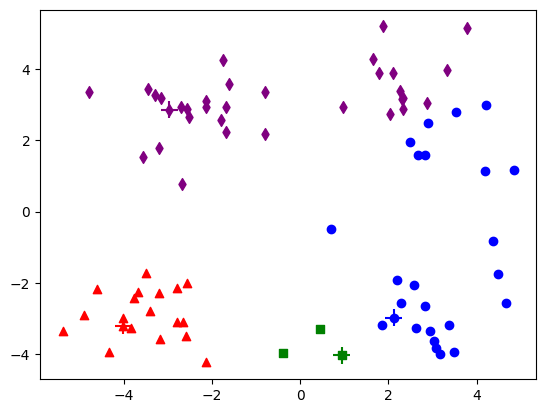

Iteration 1, Loss 409.495


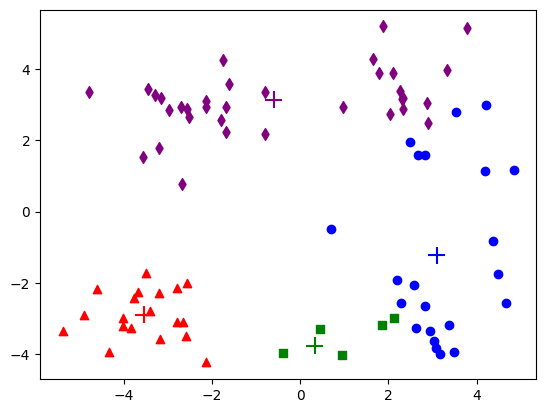

Iteration 2, Loss 395.264


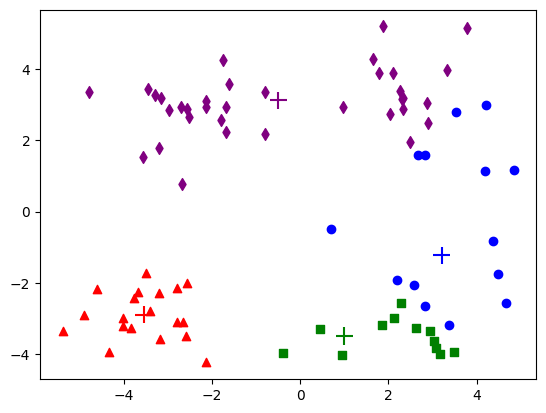

Iteration 3, Loss 346.068


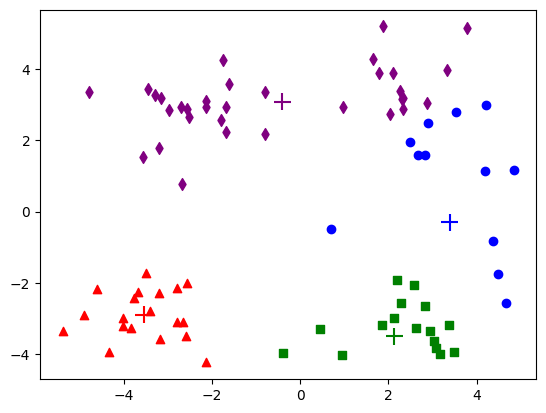

Iteration 4, Loss 294.244


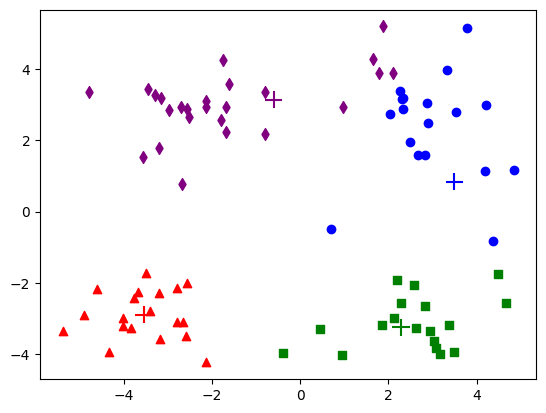

Iteration 5, Loss 178.808


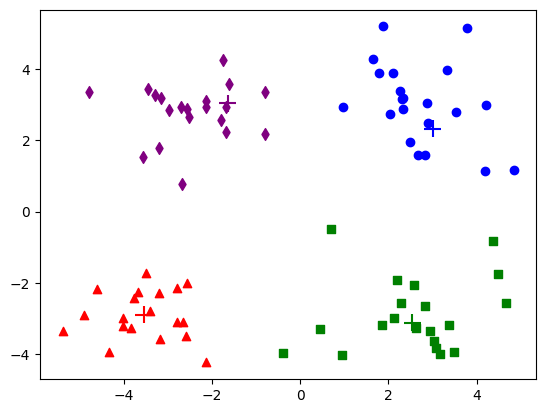

Iteration 6, Loss 151.090


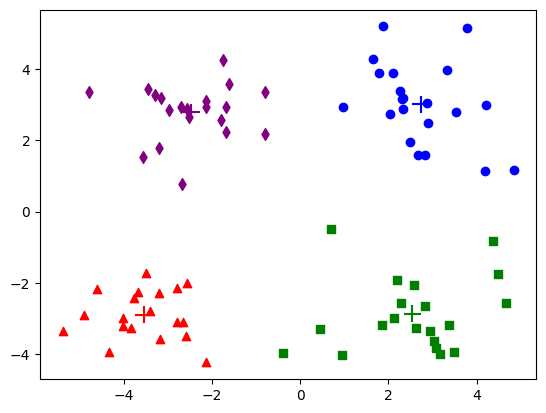

In [88]:
np.random.seed(0)
cent, cluster = Kmeans(dataset, 4, random_init)

In [89]:
def kmeanspp_init(dataset, K):
    # 随机第一个中心点
    idx = np.random.choice(np.arange(len(dataset)))
    centroids = dataset[idx][None]
    for k in range(1, K):
        d = []
        # 计算每个点到当前中心点的距离
        for data in dataset:
            dis = np.sum((centroids - data) ** 2, axis=-1)
            # 取最短距离的平方
            d.append(np.min(dis) ** 2)
        # 归一化
        d = np.array(d)
        d /= np.sum(d)
        # 按概率选取下一个中心点
        cent_id = np.random.choice(np.arange(len(dataset)), p=d)
        cent = dataset[cent_id]
        centroids = np.concatenate([centroids, cent[None]], axis=0)

    return centroids

Iteration 0, Loss 373.939


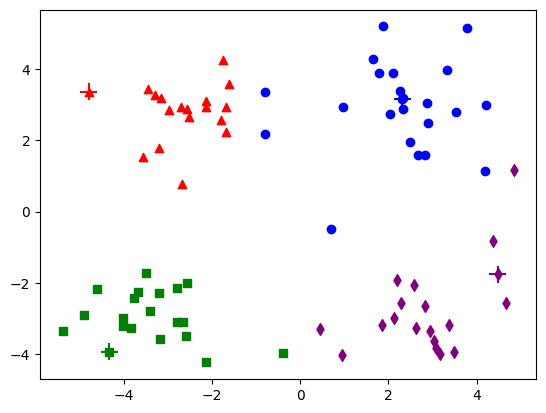

Iteration 1, Loss 158.147


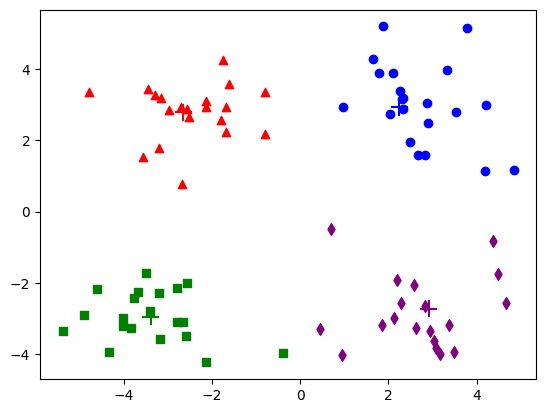

Iteration 2, Loss 151.273


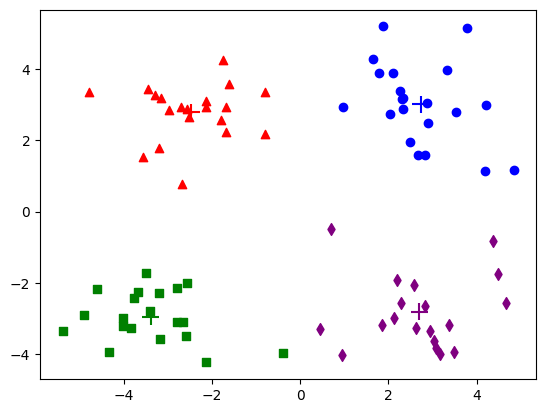

In [90]:
cent, cluster = Kmeans(dataset, 4, kmeanspp_init)

# 15 主成分分析

数据集大小： 500


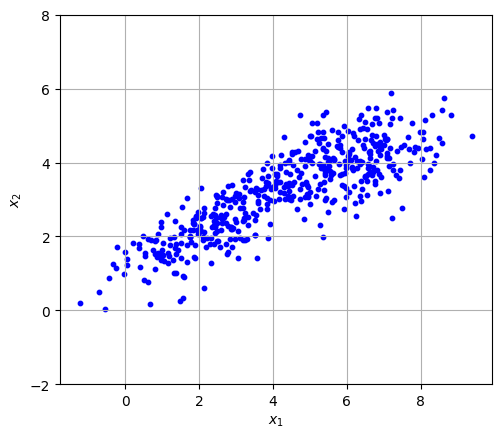

In [91]:
import numpy as np
import matplotlib.pyplot as plt

# 导入数据集
data = np.loadtxt('/kaggle/input/zhuchengfen/PCA_dataset.csv', delimiter=',')
print('数据集大小：', len(data))

# 可视化
plt.figure()
plt.scatter(data[:, 0], data[:, 1], color='blue', s=10)
plt.axis('square')
plt.ylim(-2, 8)
plt.grid()
plt.xlabel(r'$x_1$')
plt.ylabel(r'$x_2$')
plt.show()

In [92]:
def pca(X, k):
    d, m = X.shape
    if d < k:
        print('k应该小于特征数')
        return X, None

    # 中心化
    X = X - np.mean(X, axis=0)
    # 计算协方差矩阵
    cov = X.T @ X
    # 计算特征值和特征向量
    eig_values, eig_vectors = np.linalg.eig(cov)
    # 获取最大的k个特征值的下标
    idx = np.argsort(-eig_values)[:k]
    # 对应的特征向量
    W = eig_vectors[:, idx]
    # 降维
    X = X @ W
    return X, W

变换矩阵：
 [[ 0.90322448 -0.42916843]
 [ 0.42916843  0.90322448]]


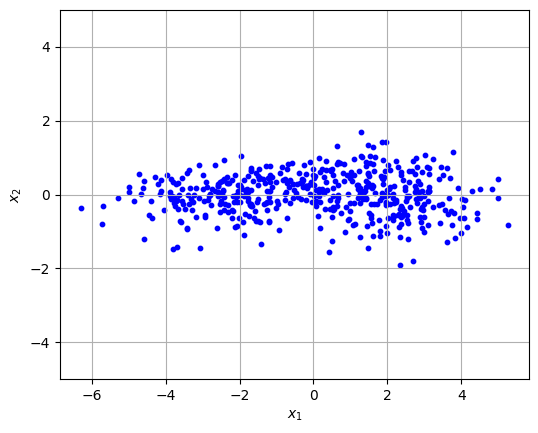

In [93]:
X, W = pca(data, 2)
print('变换矩阵：\n', W)

# 绘图
plt.figure()
plt.scatter(X[:, 0], X[:, 1], color='blue', s=10)
plt.axis('square')
plt.ylim(-5, 5)
plt.grid()
plt.xlabel(r'$x_1$')
plt.ylabel(r'$x_2$')
plt.show()

sklearn计算的变换矩阵：
 [[-0.90322448  0.42916843]
 [-0.42916843 -0.90322448]]


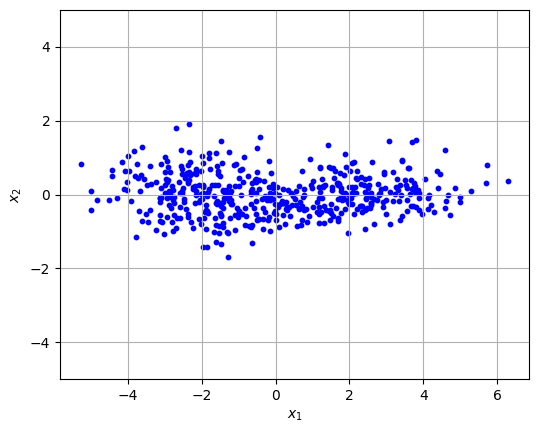

In [94]:
from sklearn.decomposition import PCA

# 中心化
X = data - np.mean(data, axis=0)
pca_res = PCA(n_components=2).fit(X)
W = pca_res.components_.T
print ('sklearn计算的变换矩阵：\n', W)
X_pca = X @ W

# 绘图
plt.figure()
plt.scatter(X_pca[:, 0], X_pca[:, 1], color='blue', s=10)
plt.axis('square')
plt.ylim(-5, 5)
plt.grid()
plt.xlabel(r'$x_1$')
plt.ylabel(r'$x_2$')
plt.show()

# 16 概率图模型.

In [95]:
import numpy as np
from sklearn.datasets import fetch_20newsgroups_vectorized
from tqdm import trange

# normalize表示是否对数据归一化，这里我们保留原始数据
# data_home是数据保存路径
train_data = fetch_20newsgroups_vectorized(subset='train', 
    normalize=False, data_home='20newsgroups')
test_data = fetch_20newsgroups_vectorized(subset='test', 
    normalize=False, data_home='20newsgroups')
print('文章主题：', '\n'.join(train_data.target_names))
print(train_data.data[0])

文章主题： alt.atheism
comp.graphics
comp.os.ms-windows.misc
comp.sys.ibm.pc.hardware
comp.sys.mac.hardware
comp.windows.x
misc.forsale
rec.autos
rec.motorcycles
rec.sport.baseball
rec.sport.hockey
sci.crypt
sci.electronics
sci.med
sci.space
soc.religion.christian
talk.politics.guns
talk.politics.mideast
talk.politics.misc
talk.religion.misc
<Compressed Sparse Row sparse matrix of dtype 'int16'
	with 340 stored elements and shape (1, 130107)>
  Coords	Values
  (0, 56979)	4
  (0, 106171)	2
  (0, 129935)	2
  (0, 119977)	2
  (0, 106184)	3
  (0, 29279)	3
  (0, 111322)	1
  (0, 29403)	3
  (0, 123796)	6
  (0, 27618)	1
  (0, 92203)	2
  (0, 66608)	16
  (0, 86247)	6
  (0, 95392)	2
  (0, 101034)	1
  (0, 115475)	10
  (0, 47982)	1
  (0, 125053)	3
  (0, 76032)	1
  (0, 20228)	1
  (0, 29573)	1
  (0, 36979)	1
  (0, 40042)	1
  (0, 33764)	1
  (0, 43740)	2
  :	:
  (0, 83940)	1
  (0, 92260)	1
  (0, 81998)	1
  (0, 106239)	1
  (0, 123430)	1
  (0, 52449)	1
  (0, 117029)	1
  (0, 114520)	1
  (0, 96088)	1
  (0, 12501

In [96]:
# 统计新闻主题频率
cat_cnt = np.bincount(train_data.target)
print('新闻数量：', cat_cnt)
log_cat_freq = np.log(cat_cnt / np.sum(cat_cnt))

# 对每个主题统计单词频率
alpha = 1.0
# 单词频率，20是主题个数，train_data.feature_names是分割出的单词
log_voc_freq = np.zeros((20, len(train_data.feature_names))) + alpha
# 单词计数，需要加上先验计数
voc_cnt = np.zeros((20, 1)) + len(train_data.feature_names) * alpha
# 用nonzero返回稀疏矩阵不为零的行列坐标
rows, cols = train_data.data.nonzero()
for i in trange(len(rows)):
    news = rows[i]
    voc = cols[i]
    cat = train_data.target[news] # 新闻类别
    log_voc_freq[cat, voc] += train_data.data[news, voc]
    voc_cnt[cat] += train_data.data[news, voc]

log_voc_freq = np.log(log_voc_freq / voc_cnt)

新闻数量： [480 584 591 590 578 593 585 594 598 597 600 595 591 594 593 599 546 564
 465 377]


100%|██████████| 1787565/1787565 [02:04<00:00, 14392.20it/s]


In [97]:
def test_news(news):
    rows, cols = news.nonzero()
    # 对数后验
    log_post = np.copy(log_cat_freq)
    for row, voc in zip(rows, cols):
        # 加上每个单词在类别下的后验
        log_post += log_voc_freq[:, voc]
    return np.argmax(log_post)

In [98]:
preds = []
for news in test_data.data:
    preds.append(test_news(news))
acc = np.mean(np.array(preds) == test_data.target)
print('分类准确率：', acc)

分类准确率： 0.7823951141795008


In [99]:
from sklearn.naive_bayes import MultinomialNB

mnb = MultinomialNB(alpha=alpha)
mnb.fit(train_data.data, train_data.target)
print('分类准确率：', mnb.score(test_data.data, test_data.target))

分类准确率： 0.7728359001593202


In [100]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

# 读取原图
orig_img = np.array(mpimg.imread('/kaggle/input/jpg-noisyimg-and-origimg/origimg.jpg'), dtype=int)
orig_img[orig_img < 128] = -1 # 黑色设置为-1
orig_img[orig_img >= 128] = 1 # 白色设置为1

# 读取带噪图像
noisy_img = np.array(mpimg.imread('/kaggle/input/jpg-noisyimg-and-origimg/noisyimg.jpg'), dtype=int)
noisy_img[noisy_img < 128] = -1
noisy_img[noisy_img >= 128] = 1

In [101]:
def compute_noise_rate(noisy, orig):
    err = np.sum(noisy != orig)
    return err / orig.size

init_noise_rate = compute_noise_rate(noisy_img, orig_img)
print (f'带噪图像与原图不一致的像素比例：{init_noise_rate * 100:.4f}%')

带噪图像与原图不一致的像素比例：9.9386%


In [102]:
# 计算坐标(i, j)处的局部能量
def compute_energy(X, Y, i, j, alpha, beta):
    # X：当前图像
    # Y：带噪图像
    energy = -beta * X[i][j] * Y[i][j]
    # 判断坐标是否超出边界
    if i > 0:
        energy -= alpha * X[i][j] * X[i - 1][j]
    if i < X.shape[0] - 1:
        energy -= alpha * X[i][j] * X[i + 1][j]
    if j > 0:
        energy -= alpha * X[i][j] * X[i][j - 1]
    if j < X.shape[1] - 1:
        energy -= alpha * X[i][j] * X[i][j + 1]
    return energy

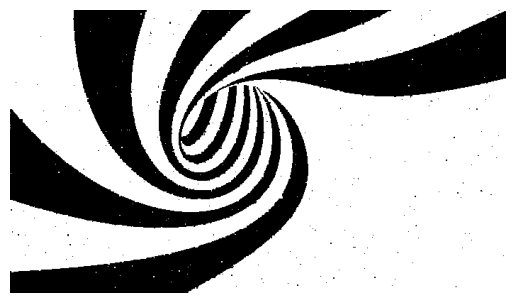

迭代轮数：0，噪声率：0.5632%


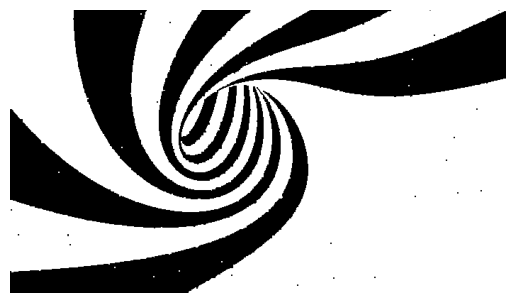

迭代轮数：1，噪声率：0.4071%


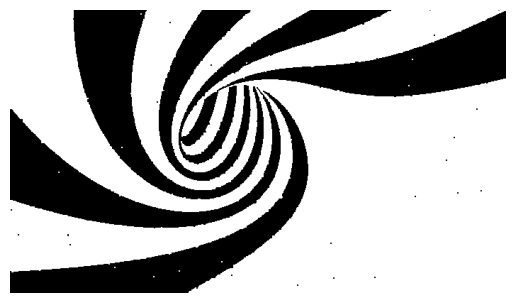

迭代轮数：2，噪声率：0.3993%


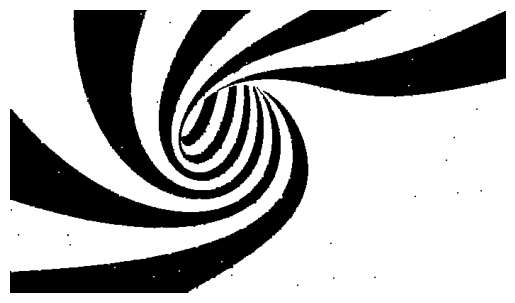

迭代轮数：3，噪声率：0.3979%


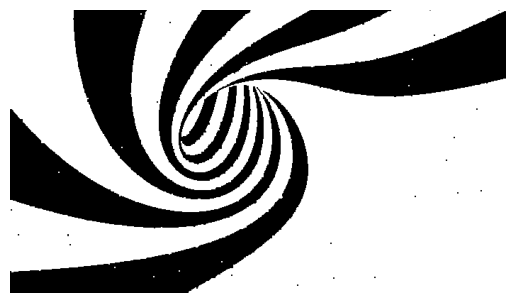

迭代轮数：4，噪声率：0.3975%


In [103]:
# 设置超参数
alpha = 2.1
beta = 1.0
max_iter = 5

# 逐像素优化
# 复制一份噪声图像，保持网络中的Y不变，只优化X
X = np.copy(noisy_img)
for k in range(max_iter):
    for i in range(X.shape[0]): # 枚举所有像素
        for j in range(X.shape[1]):
            # 分别计算当前像素取1和-1时的能量
            X[i, j] = 1
            pos_energy = compute_energy(X, noisy_img, i, j, alpha, beta)
            X[i, j] = -1
            neg_energy = compute_energy(X, noisy_img, i, j, alpha, beta)
            # 将该像素设置为使能量最低的值
            X[i, j] = 1 if pos_energy < neg_energy else -1
    
    # 展示图像并计算噪声率
    plt.figure()
    plt.axis('off')
    plt.imshow(X, cmap='binary_r')
    plt.show()
    noise_rate = compute_noise_rate(X, orig_img) * 100
    print(f'迭代轮数：{k}，噪声率：{noise_rate:.4f}%')

# 17 EM算法

In [104]:
import numpy as np
import matplotlib.pyplot as plt

X = np.loadtxt('/kaggle/input/sindata/sindata.csv', delimiter=',')

In [105]:
# 计算多元高斯分布的概率密度的对数
def log_gaussian_prob(x, mu, sigma):
    d = x.shape[-1]
    det = np.linalg.det(sigma)
    diff = x - mu
    # 由于x可能包含多个样本
    # x.T @ inv(sigma) @ x 的第二个乘法只需要保留前后样本一致的部分，
    # 所以第二个乘法用点乘再求和代替
    # 此外，由于数据存储维度的问题，这里的转置和上面公式中的转置相反
    log_prob = -d / 2 * np.log(2 * np.pi) - 0.5 * np.log(det) \
             - 0.5 * np.sum(diff @ np.linalg.inv(sigma) * diff, axis=-1)
    return log_prob

In [106]:
from sklearn.cluster import KMeans
from scipy.special import logsumexp

class GMM:

    def __init__(self, n_components=2, eps=1e-4, max_iter=100, init='random'):
        # n_components：GMM中高斯分布的数目
        # eps：迭代精度，当对数似然的变化小于eps时迭代终止
        # max_iter：最大迭代次数
        # init：初始化方法，random或kmeans
        self.k = n_components
        self.eps = eps
        self.max_iter = max_iter
        self.init = init
        self.phi = None # 隐变量的先验分布，即每个高斯分布的占比
        self.means = None # 每个高斯分布的均值
        self.covs = None # 每个高斯分布的协方差

    def EM_fit(self, X):
        # 用EM算法求解GMM的参数
        # 参数初始化
        if self.init == 'random': 
            self._random_init_params(X) 
        elif self.init == 'kmeans':
            self._kmeans_init_params(X)
        else:
            raise NotImplementedError
        ll = self._calc_log_likelihood(X) # 当前的对数似然
        n, d = X.shape
        # 开始迭代
        qz = np.zeros((n, self.k)) # z的后验分布
        for t in range(self.max_iter):
            # E步骤，更新后验分布
            for i in range(self.k):
                # 计算样本属于第i类的概率
                log_prob = log_gaussian_prob(X, self.means[i], self.covs[i])
                qz[:, i] = self.phi[i] * np.exp(log_prob)
            # 归一化
            qz = qz / np.sum(qz, axis=1).reshape(-1, 1)

            # M步骤，统计更新参数，最大化对数似然
            self.phi = np.sum(qz, axis=0) / n # 更新隐变量分布
            for i in range(self.k):
                # 更新均值
                self.means[i] = np.sum(qz[:, i, None] * X, axis=0) \
                    / n / self.phi[i]
                # 更新协方差
                diff = X - self.means[i]
                self.covs[i] = (qz[:, i, None] * diff).T @ diff \
                    / (n - 1) / self.phi[i]
            
            # 判断对数似然是否收敛
            new_ll = self._calc_log_likelihood(X)
            # assert new_ll >= ll, new_ll
            if new_ll - ll <= self.eps:
                break
            ll = new_ll
            
    def _calc_log_likelihood(self, X):
        # 计算当前的对数似然
        ll = 0
        for i in range(self.k):
            log_prob = log_gaussian_prob(X, self.means[i], self.covs[i])
            # 用logsumexp简化计算
            # 该函数底层对对数-求和-指数形式的运算做了优化
            ll += logsumexp(log_prob + np.log(self.phi[i]))
        return ll

    def _random_init_params(self, X):
        self.phi = np.random.uniform(0, 1, self.k) # 随机采样phi
        self.phi /= np.sum(self.phi)
        self.means = np.random.uniform(np.min(X), np.max(X), 
            (self.k, X.shape[1])) # 随机采样均值
        self.covs = np.random.uniform(-1, 1, 
            (self.k, X.shape[1], X.shape[1])) # 随机采样协方差
        self.covs += np.eye(X.shape[1]) * X.shape[1] # 加上维度倍的单位矩阵

    def _kmeans_init_params(self, X):
        # 用Kmeans算法初始化参数
        # 简单起见，我们直接调用sklearn库中的Kmeans方法
        kmeans = KMeans(n_clusters=self.k, init='random', 
            n_init='auto', random_state=0).fit(X)
        # 计算高斯分布占比
        data_in_cls = np.bincount(kmeans.labels_, minlength=self.k)
        self.phi = data_in_cls / len(X)
        # 计算均值和协方差
        self.means = np.zeros((self.k, X.shape[1]))
        self.covs = np.zeros((self.k, X.shape[1], X.shape[1]))
        for i in range(self.k):
            # 取出属于第i类的样本
            X_i = X[kmeans.labels_ == i]
            self.means[i] = np.mean(X_i, axis=0)
            diff = X_i - self.means[i]
            self.covs[i] = diff.T @ diff / (len(X_i) - 1)

In [107]:
import matplotlib as mpl

def plot_elipses(gmm, ax):
    # 绘制椭圆
    # gmm：GMM模型
    # ax：matplotlib的画布
    covs = gmm.covs
    for i in range(len(covs)):
        # 计算椭圆参数
        cov = covs[i][:2, :2]
        v, w = np.linalg.eigh(cov)
        u = w[0] / np.linalg.norm(w[0])
        ang = np.arctan2(u[1], u[0])
        ang = ang * 180 / np.pi
        v = 2.0 * np.sqrt(2.0) * np.sqrt(v)
        # 设置椭圆的绘制参数
        # facecolor和edgecolor分别是填充颜色和边缘颜色
        # 可以自由调整
        elp = mpl.patches.Ellipse(gmm.means[i, :2], v[0], v[1], 
            angle=180 + ang, facecolor='orange', edgecolor='none')
        elp.set_clip_box(ax.bbox)
        # 设置透明度
        elp.set_alpha(0.5)
        ax.add_artist(elp)

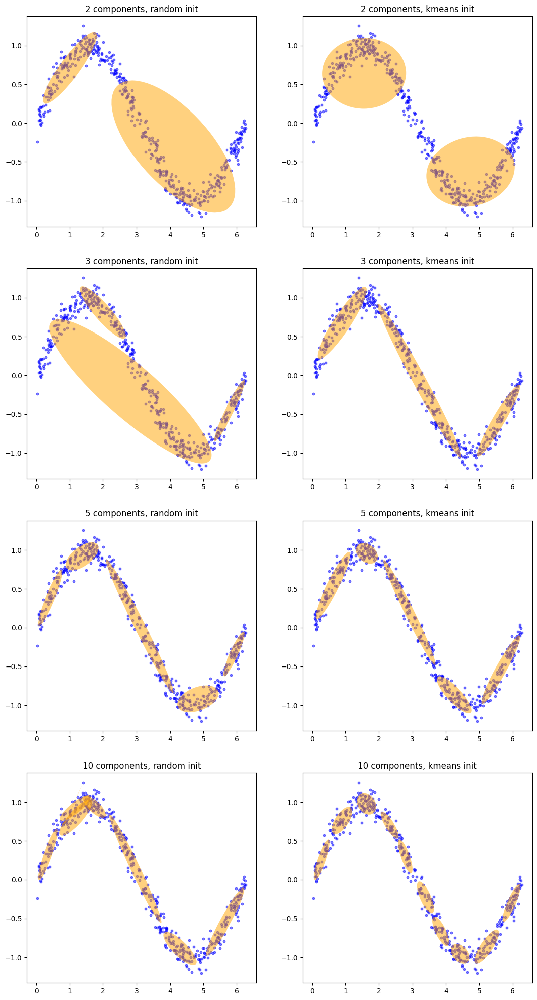

In [108]:
# 超参数
max_iter = 100
eps = 1e-4
np.random.seed(0)

n_components = [2, 3, 5, 10]
inits = ['random', 'kmeans']
fig = plt.figure(figsize=(13, 25))
for i in range(8):
    ax = fig.add_subplot(4, 2, i + 1)
    # 绘制原本的数据点
    ax.scatter(X[:, 0], X[:, 1], color='blue', s=10, alpha=0.5)
    # 初始化并拟合GMM
    k = n_components[i // 2]
    init = inits[i % 2]
    gmm = GMM(k, eps, max_iter, init)
    gmm.EM_fit(X)
    # 绘制椭圆
    plot_elipses(gmm, ax)
    ax.set_title(f'{k} components, {init} init')
plt.show()

# 18 自动编码器

In [109]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torch.nn as nn

# 导入数据
mnist_train = pd.read_csv("/kaggle/input/digit-recognizer/train.csv")
mnist_test = pd.read_csv("/kaggle/input/digit-recognizer/test.csv")
print(mnist_test.shape)  # 检查测试集的形状

# 提取出图像信息，并将内容从0~255的整数转换为0.0~1.0的浮点数
# 图像大小为28*28，数组中每一行代表一张图像
x_train = mnist_train.iloc[:, 1:].to_numpy().reshape(-1, 28 * 28) / 255
# 直接对测试集进行重新调整形状
x_test = mnist_test.to_numpy().reshape(-1, 28 * 28) / 255

# x_test = mnist_test.iloc[:, 1:].to_numpy().reshape(-1, 28 * 28) / 255
print(f'训练集大小：{len(x_train)}')
print(f'测试集大小：{len(x_test)}')

(28000, 784)
训练集大小：42000
测试集大小：28000


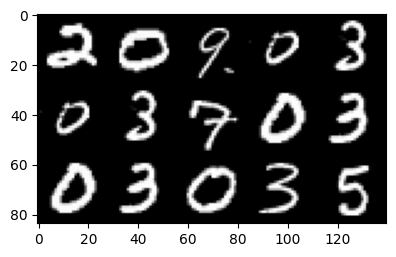

In [110]:
def display(data, m, n):
    # data：图像的像素数据，每行代表一张图像
    # m，n：按m行n列的方式展示前m * n张图像
    img = np.zeros((28 * m, 28 * n))
    for i in range(m):
        for j in range(n):
            # 填充第i行j列图像的数据
            img[i * 28: (i + 1) * 28, j * 28: (j + 1) * 28] = \
                data[i * m + j].reshape(28, 28)
    plt.figure(figsize=(m * 1.5, n * 1.5))
    plt.imshow(img, cmap='gray')
    plt.show()

display(x_test, 3, 5)

In [111]:
# 多层感知机
class MLP(nn.Module):

    def __init__(self, layer_sizes):
        super().__init__()
        self.layers = nn.ModuleList() # ModuleList用列表存储PyTorch模块
        num_in = layer_sizes[0]
        for num_out in layer_sizes[1:]:
            # 创建全连接层
            self.layers.append(nn.Linear(num_in, num_out))
            # 创建逻辑斯谛激活函数层
            self.layers.append(nn.Sigmoid())
            num_in = num_out

    def forward(self, x):
        # 前向传播
        for l in self.layers:
            x = l(x)
        return x

layer_sizes = [784, 256, 128, 100]
encoder = MLP(layer_sizes)
decoder = MLP(layer_sizes[::-1]) # 解码器的各层大小与编码器相反

训练轮数：0，平均损失：0.0320


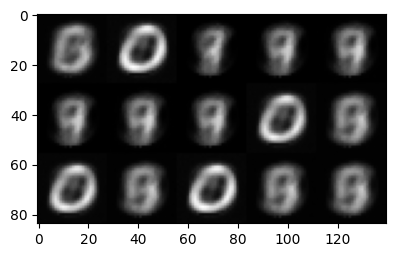

训练轮数：2，平均损失：0.0223


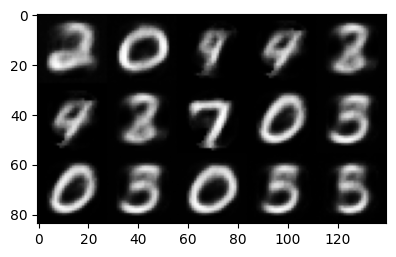

训练轮数：4，平均损失：0.0150


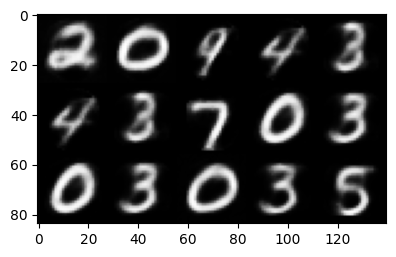

训练轮数：6，平均损失：0.0123


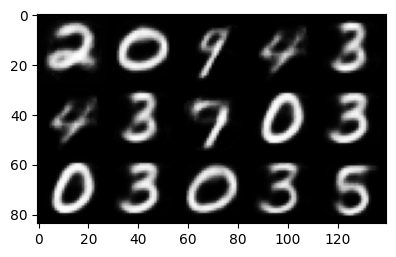

训练轮数：8，平均损失：0.0103


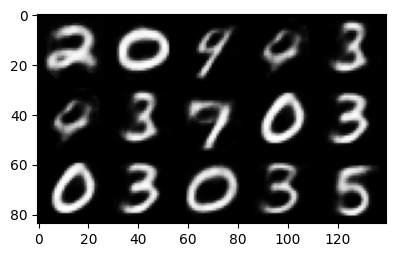

训练轮数：9，平均损失：0.0094


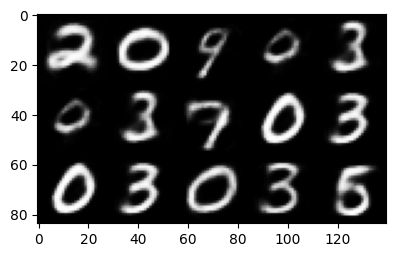

In [112]:
# 训练超参数
learning_rate = 0.01 # 学习率
max_epoch = 10 # 训练轮数
batch_size = 256 # 批量大小
display_step = 2 # 展示间隔
np.random.seed(0)
torch.manual_seed(0)

# 采用Adam优化器，编码器和解码器的参数共同优化
optimizer = torch.optim.Adam(list(encoder.parameters()) \
    + list(decoder.parameters()), lr=learning_rate)
# 开始训练
for i in range(max_epoch):
    # 打乱训练样本
    idx = np.arange(len(x_train))
    idx = np.random.permutation(idx)
    x_train = x_train[idx]
    st = 0
    ave_loss = [] # 记录每一轮的平均损失
    while st < len(x_train):
        # 遍历数据集
        ed = min(st + batch_size, len(x_train))
        X = torch.from_numpy(x_train[st: ed]).to(torch.float32)
        Z = encoder(X)
        X_rec = decoder(Z)
        loss = 0.5 * nn.functional.mse_loss(X, X_rec) # 重建损失
        ave_loss.append(loss.item())
        optimizer.zero_grad() 
        loss.backward() # 梯度反向传播
        optimizer.step()
        st = ed
    ave_loss = np.average(ave_loss)

    if i % display_step == 0 or i == max_epoch - 1:
        print(f'训练轮数：{i}，平均损失：{ave_loss:.4f}')
        # 选取测试集中的部分图像重建并展示
        with torch.inference_mode():
            X_test = torch.from_numpy(x_test[:3 * 5]).to(torch.float32)
            X_test_rec = decoder(encoder(X_test))
            X_test_rec = X_test_rec.cpu().numpy()
        display(X_test_rec, 3, 5)

原始图像


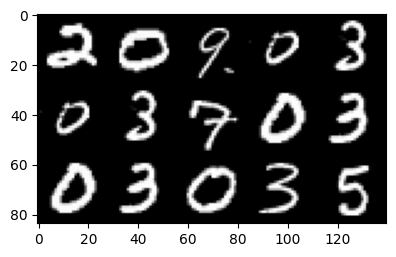

重建图像


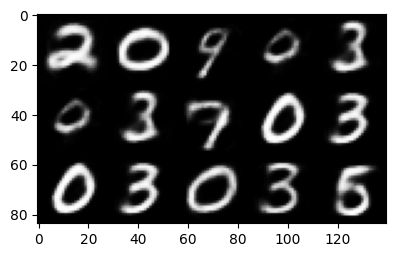

In [113]:
print('原始图像')
display(x_test, 3, 5)

print('重建图像')
X_test = torch.from_numpy(x_test[:3 * 5]).to(torch.float32)
X_test_rec = decoder(encoder(X_test))
X_test_rec = X_test_rec.detach().cpu().numpy()
display(X_test_rec, 3, 5)